In [1]:
#Importing
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import style
style.use("fivethirtyeight")

In [2]:
#Load Data
data=pd.read_csv("C:/BITsPilaniMTECH2123/Sem3/extra/marketing_campaign.csv", sep="\t")
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


## Exploratory Analysis & Pre-processing (Imputing, Encoding, Outlier Removal & Scaling)

In [3]:
data.shape

(2240, 29)

In [4]:
data.isna().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [6]:
data.drop('ID', axis=1, inplace=True)

In [7]:
data.drop(["Z_Revenue", "Z_CostContact", 'Dt_Customer'], axis=1, inplace=True)

In [8]:
data.shape

(2240, 25)

In [9]:
categoricals = ["Education", 'Marital_Status']
numericals = []
for col in data.columns:
    if not col in categoricals:
        numericals.append(col)

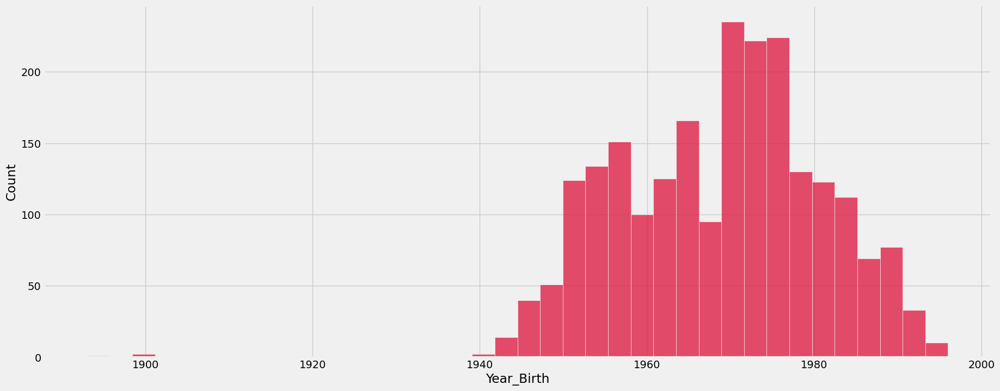

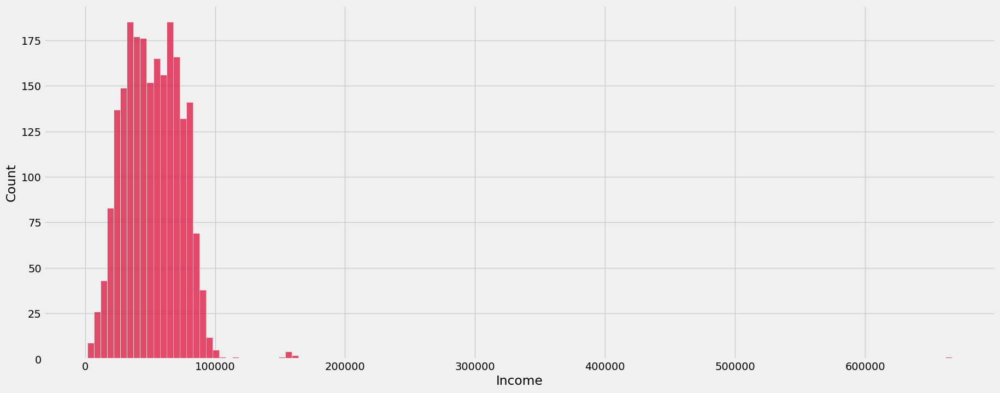

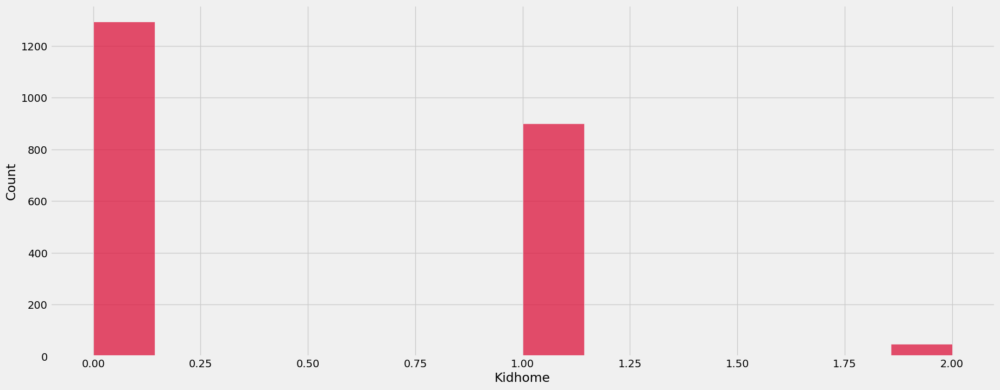

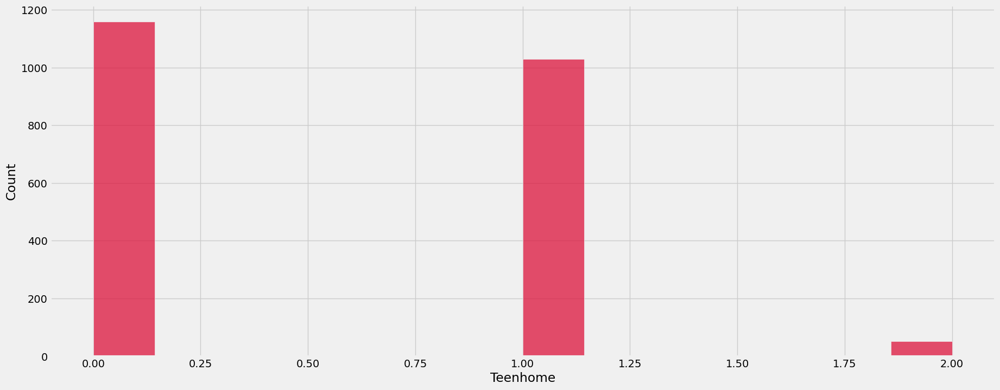

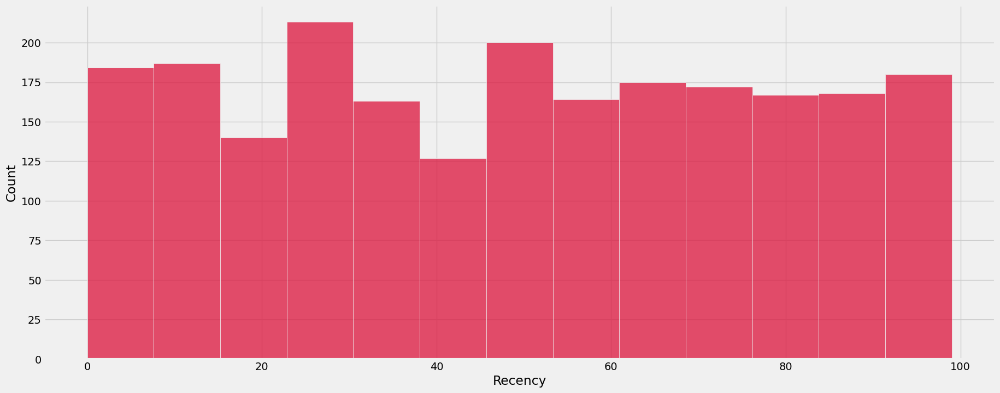

...

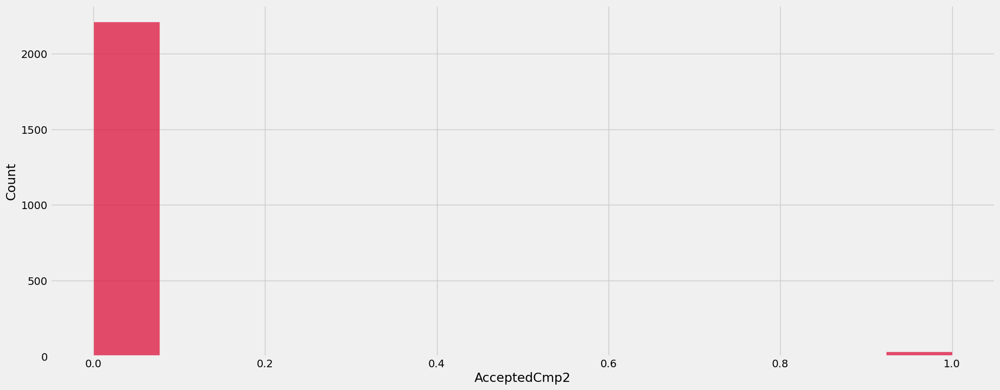

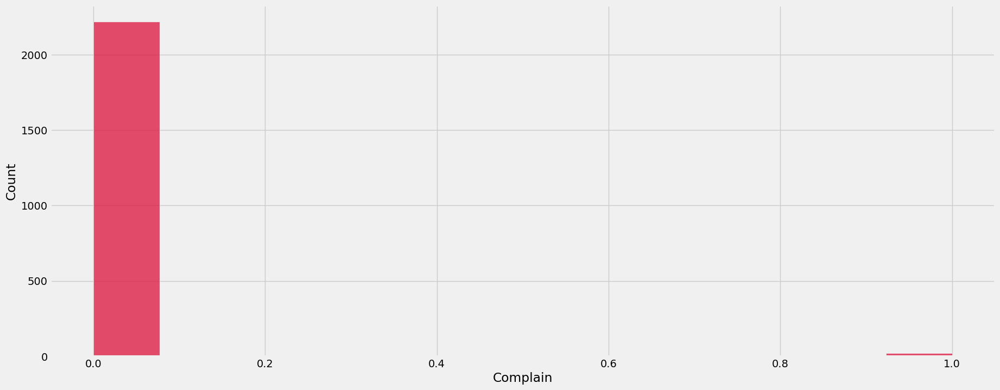

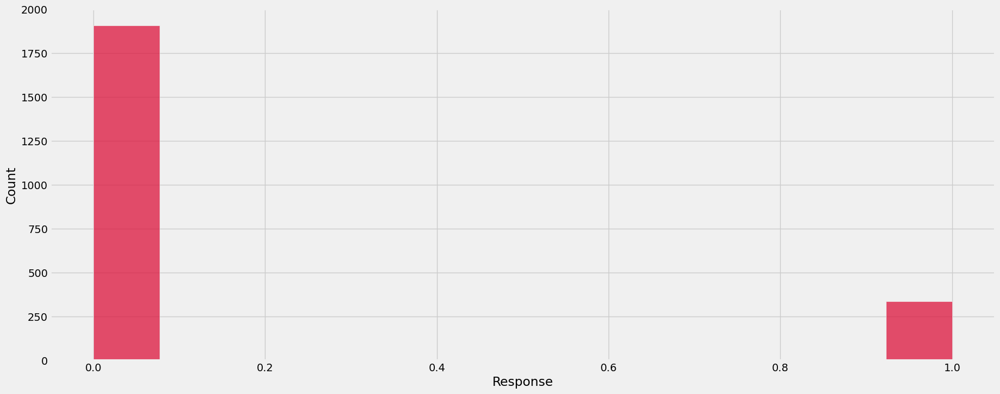

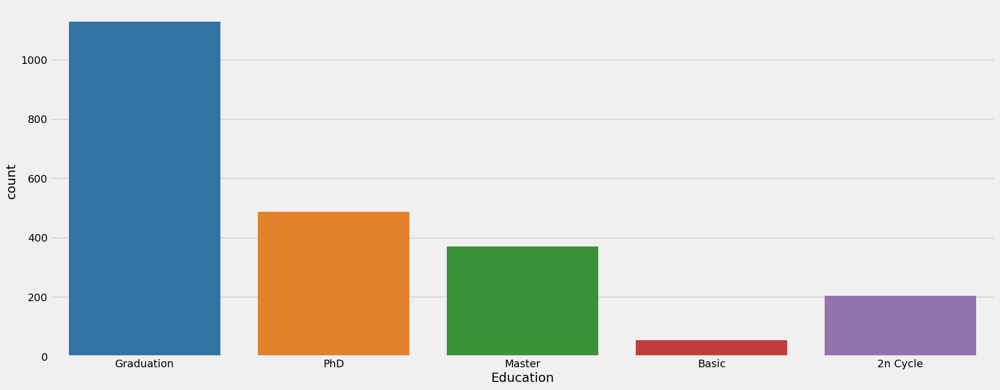

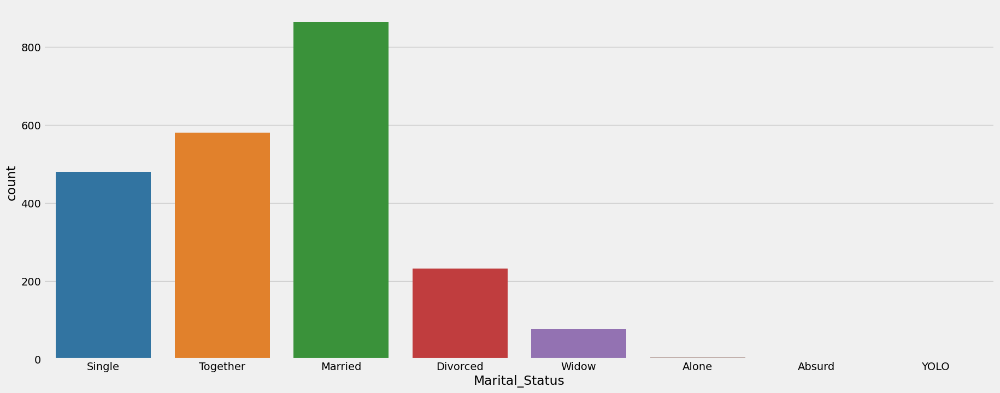

In [10]:
for col in numericals:
    plt.figure(figsize=(20,8))
    sns.histplot(data[col], color="crimson")
    plt.show()
for col in categoricals:
    plt.figure(figsize=(20,8))
    sns.countplot(x=data[col], palette="tab10")
    plt.show()

In [11]:
filler = data["Income"].median()
data["Income"] = data["Income"].fillna(filler)

In [12]:
from scipy.stats import zscore
scores=np.abs(zscore(data[numericals]))
cleaned_data=data[(scores<4).all(axis=1)]
cleaned_data.shape

(2133, 25)

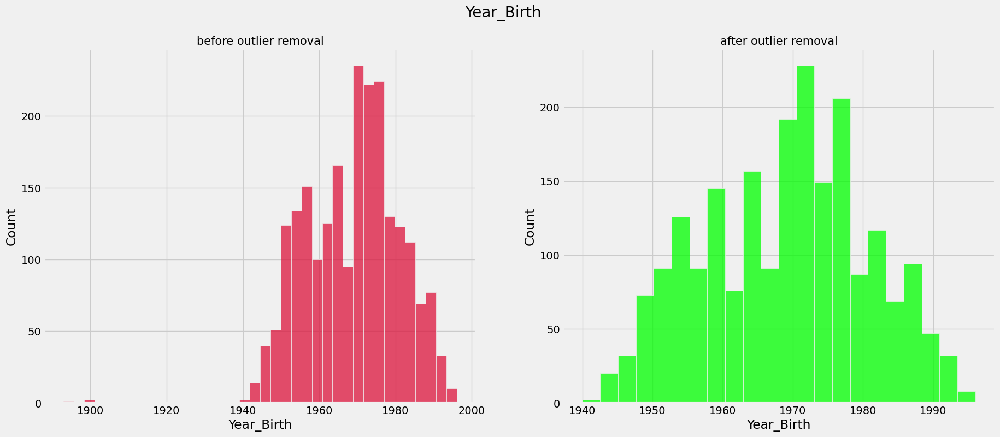

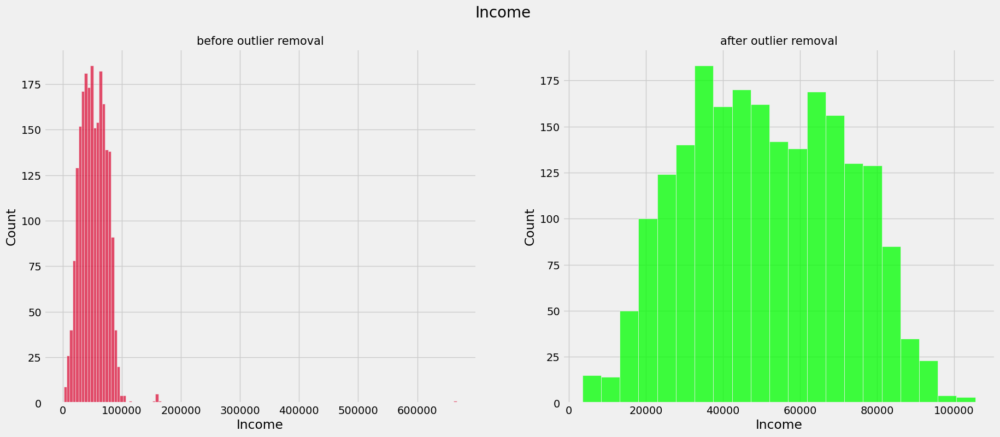

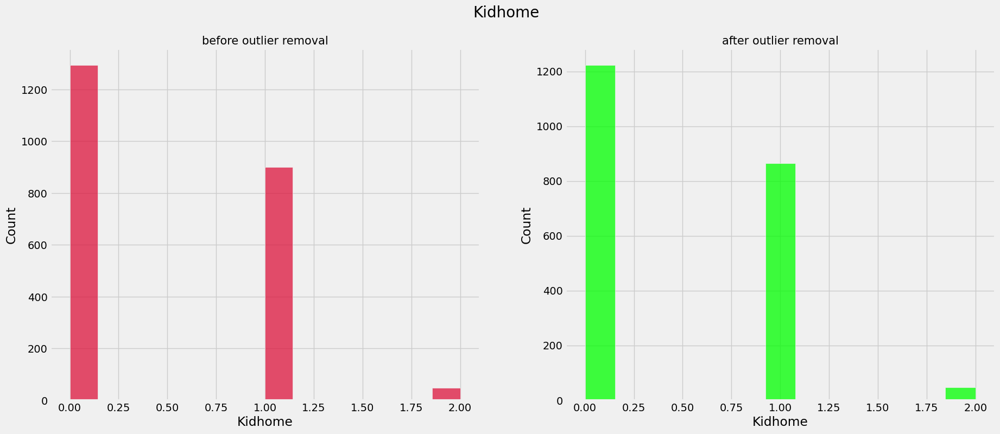

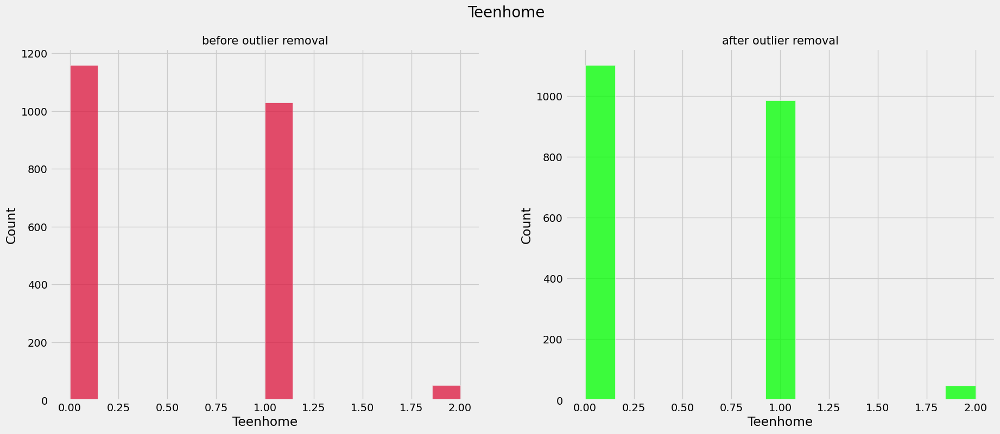

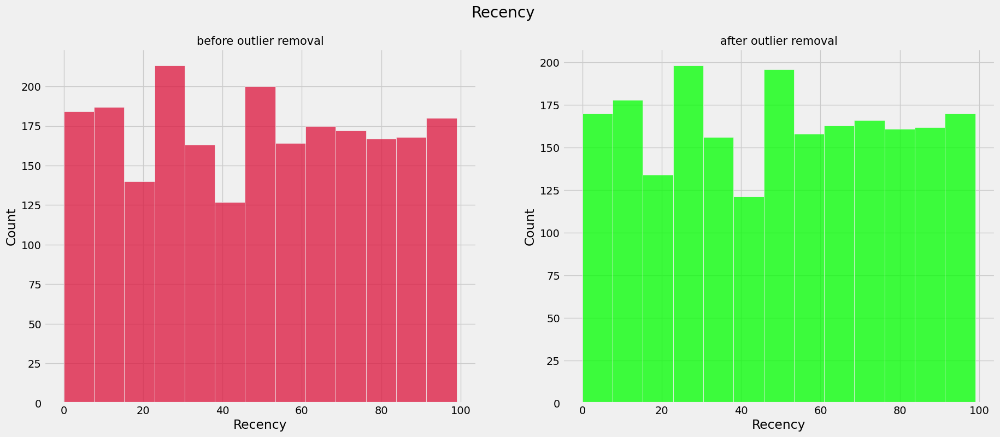

...

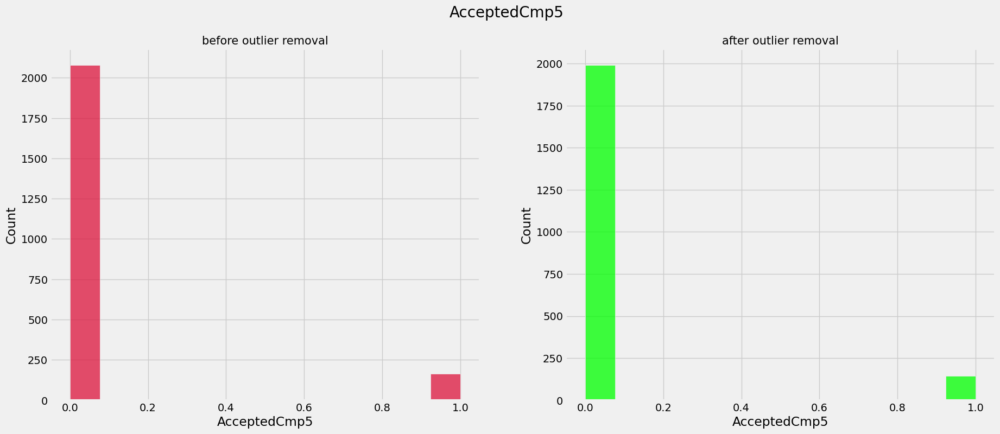

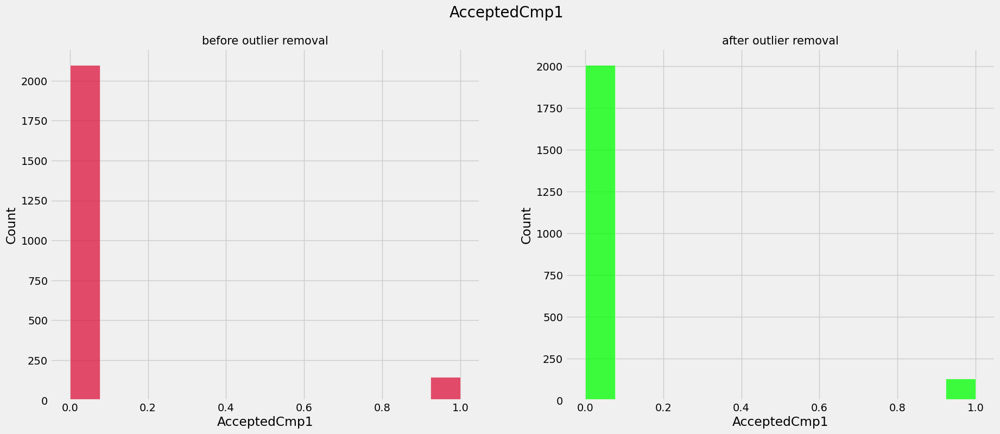

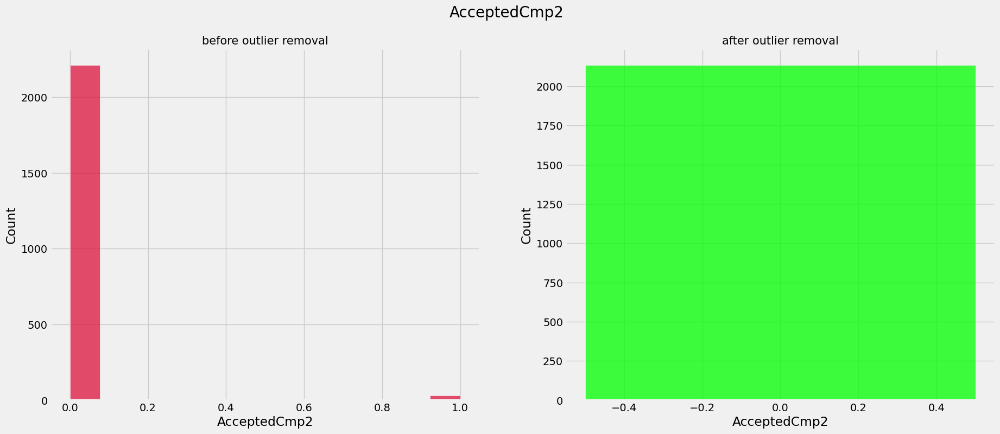

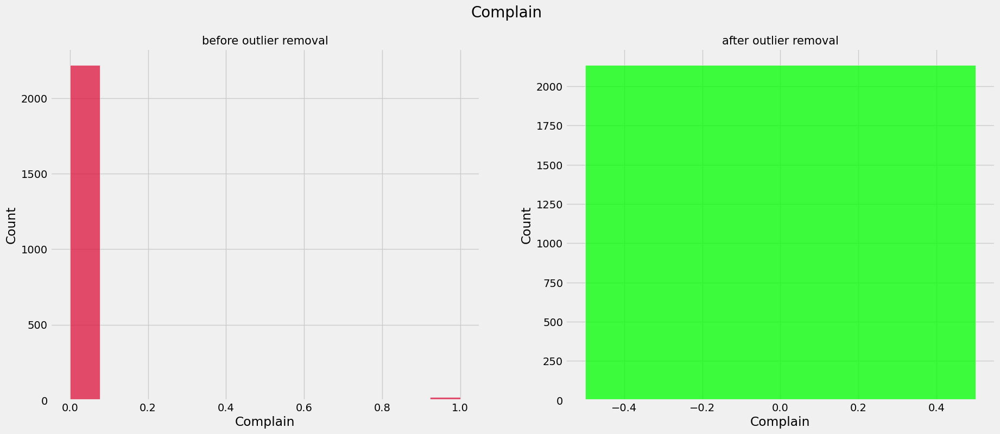

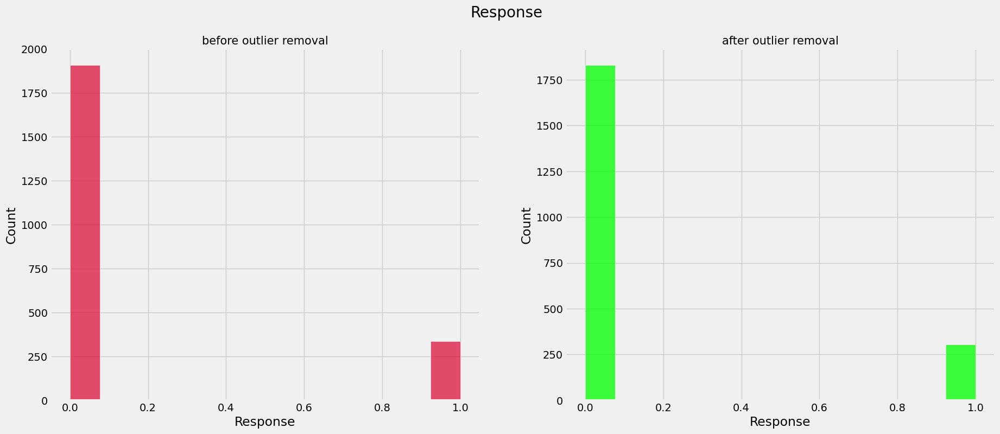

In [13]:
for col in numericals:
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20,8))
    sns.histplot(data[col], color="crimson", ax=axes[0])
    sns.histplot(cleaned_data[col], color="lime", ax=axes[1])
    axes[0].set_title("before outlier removal", fontsize=15)
    axes[1].set_title("after outlier removal", fontsize=15)
    fig.suptitle(col, fontsize=20)
    plt.show()

In [14]:
data=cleaned_data
data.shape

(2133, 25)

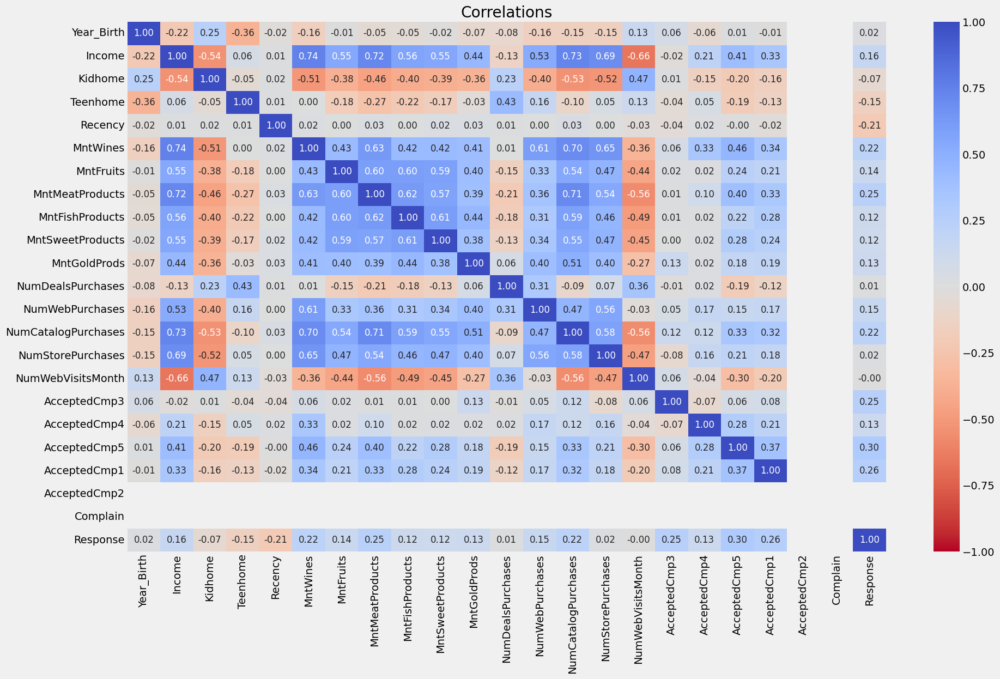

In [15]:
plt.figure(figsize=(20,12))
sns.heatmap(data[numericals].corr(), annot=True, cmap="coolwarm_r", annot_kws={"fontsize":12}, fmt=".2f", vmin=-1)
plt.title("Correlations")
plt.show()

In [16]:
for val in ["Absurd", "YOLO", "Alone"]:
    data = data[data["Marital_Status"] != val]

In [17]:
filler = data["Income"].median()
data["Income"] = data["Income"].fillna(filler)

In [18]:
data["Marital_Status"].unique()

array(['Single', 'Together', 'Married', 'Divorced', 'Widow'], dtype=object)

In [19]:
print(data.shape)
dat = data.copy()
data.head(2)

(2126, 25)


,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,Graduation,Single,58138.0,0,0,58,635,88,546,...,10,4,7,0,0,0,0,0,0,1
1,1954,Graduation,Single,46344.0,1,1,38,11,1,6,...,1,2,5,0,0,0,0,0,0,0


In [20]:
edu_encoder = {"Basic":0, "2n Cycle":1, "Graduation":2, "Master":3, "PhD":4}
data["Education"].replace(edu_encoder, inplace=True)
mar_encoder = {"Single":0, "Together":1, "Married":2, "Divorced":3, "Widow":4}
data["Marital_Status"].replace(mar_encoder, inplace=True)

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2126 entries, 0 to 2239
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Year_Birth           2126 non-null   int64  
 1   Education            2126 non-null   int64  
 2   Marital_Status       2126 non-null   int64  
 3   Income               2126 non-null   float64
 4   Kidhome              2126 non-null   int64  
 5   Teenhome             2126 non-null   int64  
 6   Recency              2126 non-null   int64  
 7   MntWines             2126 non-null   int64  
 8   MntFruits            2126 non-null   int64  
 9   MntMeatProducts      2126 non-null   int64  
 10  MntFishProducts      2126 non-null   int64  
 11  MntSweetProducts     2126 non-null   int64  
 12  MntGoldProds         2126 non-null   int64  
 13  NumDealsPurchases    2126 non-null   int64  
 14  NumWebPurchases      2126 non-null   int64  
 15  NumCatalogPurchases  2126 non-null   i

In [22]:
cleaned_data.head()

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,Graduation,Single,58138.0,0,0,58,635,88,546,...,10,4,7,0,0,0,0,0,0,1
1,1954,Graduation,Single,46344.0,1,1,38,11,1,6,...,1,2,5,0,0,0,0,0,0,0
2,1965,Graduation,Together,71613.0,0,0,26,426,49,127,...,2,10,4,0,0,0,0,0,0,0
3,1984,Graduation,Together,26646.0,1,0,26,11,4,20,...,0,4,6,0,0,0,0,0,0,0
4,1981,PhD,Married,58293.0,1,0,94,173,43,118,...,3,6,5,0,0,0,0,0,0,0


In [23]:
from sklearn.preprocessing import RobustScaler
rs = RobustScaler(quantile_range=(0,95))
scaleddata = rs.fit_transform(data)
scaleddata = pd.DataFrame(scaleddata, columns=data.columns)

## Dimensionality Reduction: Uniform Manifold Approximation & Projection (UMAP)

In [24]:
#Simply put, it's like T-SNE but better at preserving global structure, and much faster.
import umap
ump = umap.UMAP(random_state=11, n_components=3)
umap_data = ump.fit_transform(scaleddata)

In [25]:
import plotly_express as px
px.scatter_3d(x=umap_data[:,0], y=umap_data[:,1], z=umap_data[:,2], title="Distribution after UMAP")

In [26]:
print(data.shape)
umap_data_df = pd.DataFrame(umap_data)
umap_data_df.head(2)

(2126, 25)


,0,1,2
0,8.763822,10.510987,5.135139
1,-0.758488,-0.882446,11.828388


## K-Means

In [27]:
from sklearn.cluster import KMeans

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Abhishek Jaiswal\.conda\envs\ml

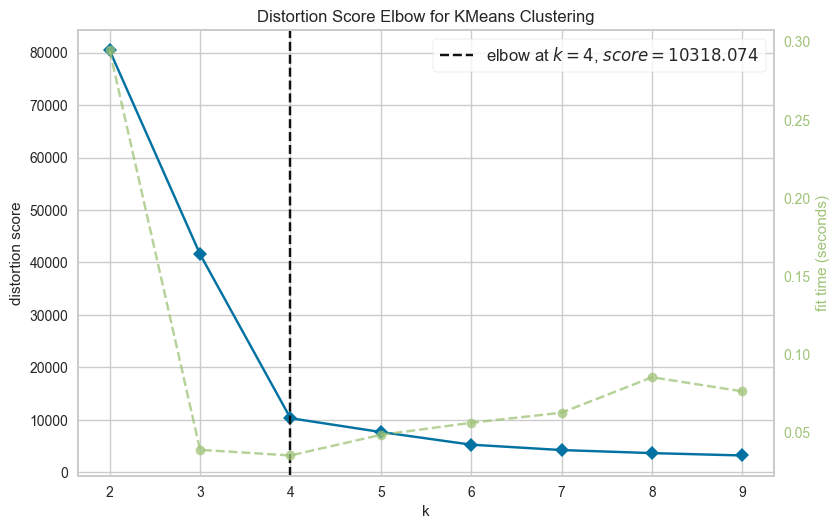

In [28]:
from yellowbrick.cluster import KElbowVisualizer

model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2,10))

visualizer.fit(umap_data_df)
visualizer.show()
plt.show()

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

C:\Users\Abhishek Jaiswal\.conda\envs\ml

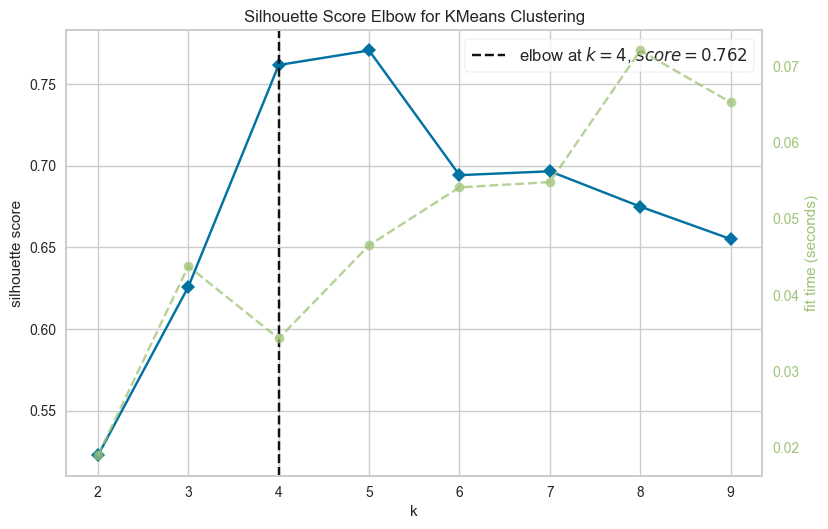

In [29]:
model = KMeans(random_state=1)
visualizer = KElbowVisualizer(model, k=(2,10), metric='silhouette')

visualizer.fit(umap_data_df)
visualizer.show()
plt.show()

In [30]:
#Silhouette score method indicates the best options would be 4 or 5 clusters. Let's compare both.

In [31]:
# 4 Clusters
KM_4_clusters = KMeans(n_clusters=4, init='k-means++').fit(umap_data_df) # initialise and fit K-Means model

KM4_clustered = umap_data_df.copy()
KM4_clustered.loc[:,'Cluster'] = KM_4_clusters.labels_ # append labels to points

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



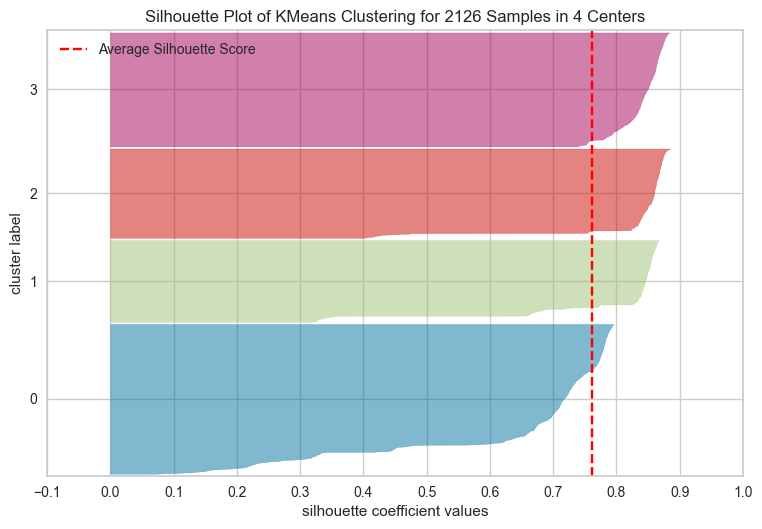

In [32]:
#Plot 1
from yellowbrick.cluster import SilhouetteVisualizer
model = KMeans(n_clusters=4, random_state=0)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(umap_data_df)
visualizer.show()
plt.show()

In [33]:
#Sizes
KM_clust_sizes = KM4_clustered.groupby('Cluster').size().to_frame()
KM_clust_sizes.columns = ["KM_size"]
KM_clust_sizes

,KM_size
Cluster,
0,732
1,400
2,437
3,557


In [34]:
#Cluster Summary
KM4_clustered.groupby('Cluster').describe()

0                                                        \
         count       mean       std        min        25%        50%   
Cluster                                                                
0        732.0   8.822741  1.485968   4.849432   8.427669   9.419998   
1        400.0  -1.161639  0.472177  -2.213924  -1.582935  -1.061706   
2        437.0  11.978362  0.932555  10.097789  11.288991  11.860690   
3        557.0   1.147257  0.951449  -0.841254   0.382403   1.350922   

                                   1             ...                        \
               75%        max  count       mean  ...        75%        max   
Cluster                                          ...                         
0         9.809964  10.520360  732.0   9.057259  ...  10.284862  11.565977   
1        -0.805868  -0.261726  400.0  -0.138956  ...   0.164575   3.501716   
2        12.707140  13.602680  437.0  -0.997570  ...  -0.765971   2.196719   
3         1.953059   2.677413  557.0  14.833951  ...  15.172840  16.161192   

             2                                                       \
         count       mean       std       min        25%        50%   
Cluster                                                               
0        732.0   5.020624  1.332717  2.754503   3.927894   4.963173   
1        400.0  11.418008  2.516382  2.629647  11.595347  11.999382   
2        437.0   8.482301  0.833592  6.229449   8.045970   8.518505   
3        557.0   8.098156  0.611787  6.704900   7.595786   8.136517   

                               
               75%        max  
Cluster                        
0         6.164001   7.690673  
1        12.434655  13.215652  
2         9.094627   9.832561  
3         8.604634   9.238311  

[4 rows x 24 columns]

In [35]:
# 5 Clusters
KM_5_clusters = KMeans(n_clusters=5, init='k-means++').fit(umap_data_df) # initialise and fit K-Means model

KM5_clustered = umap_data_df.copy()
KM5_clustered.loc[:,'Cluster'] = KM_5_clusters.labels_ # append labels to points

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



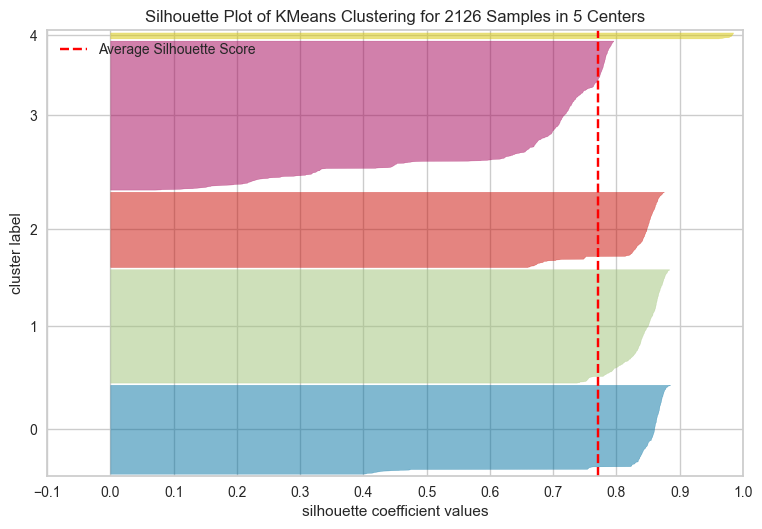

In [36]:
#Plot 1
from yellowbrick.cluster import SilhouetteVisualizer
model = KMeans(n_clusters=5, random_state=0)
visualizer = SilhouetteVisualizer(model, colors='yellowbrick')
visualizer.fit(umap_data_df)
visualizer.show()
plt.show()

In [37]:
#Sizes
KM_clust_sizes = KM5_clustered.groupby('Cluster').size().to_frame()
KM_clust_sizes.columns = ["KM_size"]
KM_clust_sizes

,KM_size
Cluster,
0,437
1,557
2,370
3,732
4,30


In [38]:
#Cluster Summary
KM5_clustered.groupby('Cluster').describe()

0                                                        \
         count       mean       std        min        25%        50%   
Cluster                                                                
0        437.0  11.978362  0.932555  10.097789  11.288991  11.860690   
1        557.0   1.147257  0.951449  -0.841254   0.382403   1.350922   
2        370.0  -1.225310  0.431638  -2.213924  -1.613976  -1.099369   
3        732.0   8.822741  1.485968   4.849432   8.427669   9.419998   
4         30.0  -0.376371  0.084942  -0.523597  -0.461423  -0.362299   

                                   1             ...                        \
               75%        max  count       mean  ...        75%        max   
Cluster                                          ...                         
0        12.707140  13.602680  437.0  -0.997570  ...  -0.765971   2.196719   
1         1.953059   2.677413  557.0  14.833951  ...  15.172840  16.161192   
2        -0.840175  -0.611004  370.0   0.059126  ...   0.236801   3.501716   
3         9.809964  10.520360  732.0   9.057259  ...  10.284862  11.565977   
4        -0.298434  -0.261726   30.0  -2.581965  ...  -2.509640  -2.364683   

             2                                                        \
         count       mean       std        min        25%        50%   
Cluster                                                                
0        437.0   8.482301  0.833592   6.229449   8.045970   8.518505   
1        557.0   8.098156  0.611787   6.704900   7.595786   8.136517   
2        370.0  12.119532  0.515999  11.325457  11.676690  12.045068   
3        732.0   5.020624  1.332717   2.754503   3.927894   4.963173   
4         30.0   2.765895  0.121515   2.629647   2.667320   2.721288   

                               
               75%        max  
Cluster                        
0         9.094627   9.832561  
1         8.604634   9.238311  
2        12.462096  13.215652  
3         6.164001   7.690673  
4         2.833070   3.006998  

[5 rows x 24 columns]

## Density-Based Spatial Clustering for Applications with Noise (DBSCAN)

### DBSCAN
### This algorithm clusters data based on density and typically requires uniform density within a cluster and density drops between clusters. It has two main parameters that need to be chosen carefully to obtain optimal results:

### eps: the radius that defines the neighborhood around each data point.
### min_samples: the minimum number of data points required in a neighborhood for a data point to be considered a core point.

### DBSCAN classifies data points into three categories:

### Core point: a point that has at least min_samples data points within a neighborhood of radius eps.
### Border point: a point that has less than min_samples, but at least one core point in its neighborhood.
### Noise: a point that is neither a core point nor a border point and has less than min_samples points in its neighborhood.

### The algorithm starts by picking a point at random and, if the parameter requirements are met, starts assigning data points to clusters. The clusters are then expanded by recursively calculating the neighborhood around each data point until all points have been visited.

In [39]:
#https://towardsdatascience.com/dbscan-clustering-break-it-down-for-me-859650a723af
#https://towardsdatascience.com/density-based-clustering-dbscan-vs-hdbscan-39e02af990c7

In [40]:
from sklearn.cluster import DBSCAN

In [41]:
from itertools import product

eps_values = np.arange(0.2,1.5,0.1) # eps values to be investigated
min_samples = np.arange(10,30) # min_samples values to be investigated

DBSCAN_params = list(product(eps_values, min_samples))
DBSCAN_params


[(0.2, 10),
 (0.2, 11),
 (0.2, 12),
 (0.2, 13),
 (0.2, 14),
 (0.2, 15),
 (0.2, 16),
 (0.2, 17),
 (0.2, 18),
 (0.2, 19),
 (0.2, 20),
 (0.2, 21),
 (0.2, 22),
 (0.2, 23),
 (0.2, 24),
 (0.2, 25),
 (0.2, 26),
 (0.2, 27),
 (0.2, 28),
 (0.2, 29),
 (0.30000000000000004, 10),
 (0.30000000000000004, 11),
 (0.30000000000000004, 12),
 (0.30000000000000004, 13),
 (0.30000000000000004, 14),
 (0.30000000000000004, 15),
 (0.30000000000000004, 16),
 (0.30000000000000004, 17),
 (0.30000000000000004, 18),
 (0.30000000000000004, 19),
 (0.30000000000000004, 20),
 (0.30000000000000004, 21),
 (0.30000000000000004, 22),
 (0.30000000000000004, 23),
 (0.30000000000000004, 24),
 (0.30000000000000004, 25),
 (0.30000000000000004, 26),
 (0.30000000000000004, 27),
 (0.30000000000000004, 28),
 (0.30000000000000004, 29),
 (0.4000000000000001, 10),
 (0.4000000000000001, 11),
 (0.4000000000000001, 12),
 (0.4000000000000001, 13),
 (0.4000000000000001, 14),
 (0.4000000000000001, 15),
 (0.4000000000000001, 16),
 (0.4000000

In [43]:
from sklearn.metrics import silhouette_score

pca_eps_values = np.arange(0.2,1.5,0.1) 
pca_min_samples = np.arange(2,5) 
pca_dbscan_params = list(product(pca_eps_values, pca_min_samples))
pca_no_of_clusters = []
pca_sil_score = []
pca_epsvalues = []
pca_min_samp = []
for p in pca_dbscan_params:
    pca_dbscan_cluster = DBSCAN(eps=p[0], min_samples=p[1]).fit(umap_data_df)
    pca_epsvalues.append(p[0])
    pca_min_samp.append(p[1])
    pca_no_of_clusters.append(len(np.unique(pca_dbscan_cluster.labels_)))
    pca_sil_score.append(silhouette_score(umap_data_df, pca_dbscan_cluster.labels_))
    
pca_eps_min = list(zip(pca_no_of_clusters, pca_sil_score, pca_epsvalues, pca_min_samp))
pca_eps_min_df = pd.DataFrame(pca_eps_min, columns=['no_of_clusters', 'silhouette_score', 'epsilon_values', 'minimum_points'])
pca_eps_min_df

,no_of_clusters,silhouette_score,epsilon_values,minimum_points
0,92,0.262606,0.2,2
1,78,0.298520,0.2,3
2,74,0.333703,0.2,4
3,27,0.194266,0.3,2
4,25,0.216009,0.3,3
5,24,0.282009,0.3,4
6,15,0.390914,0.4,2
7,15,0.390914,0.4,3
8,15,0.390914,0.4,4
9,13,0.502963,0.5,2


In [44]:
from sklearn.metrics import silhouette_score

no_of_clusters = []
sil_score = []

for p in DBSCAN_params:
    DBS_clustering = DBSCAN(eps=p[0], min_samples=p[1]).fit(umap_data_df)
    no_of_clusters.append(len(np.unique(DBS_clustering.labels_)))
    sil_score.append(silhouette_score(umap_data_df, DBS_clustering.labels_))

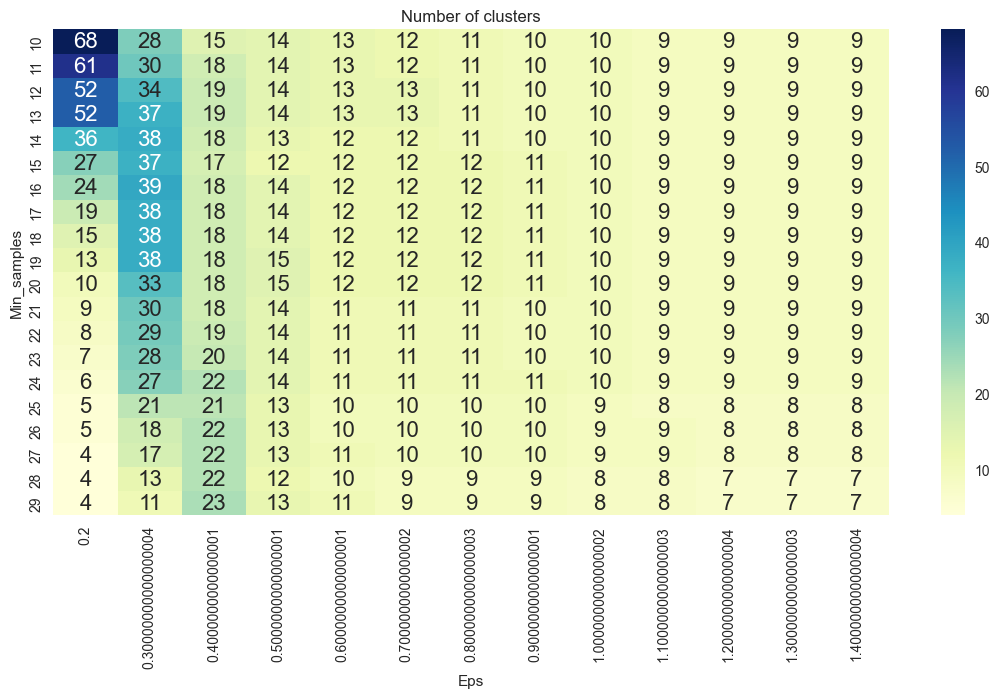

In [45]:
#A heatplot below shows how many clusters were generated by the DBSCAN algorithm for the respective parameters combinations.

tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['No_of_clusters'] = no_of_clusters

pivot_1 = pd.pivot_table(tmp, values='No_of_clusters', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(pivot_1, annot=True,annot_kws={"size": 16}, cmap="YlGnBu", ax=ax)
ax.set_title('Number of clusters')
plt.show()

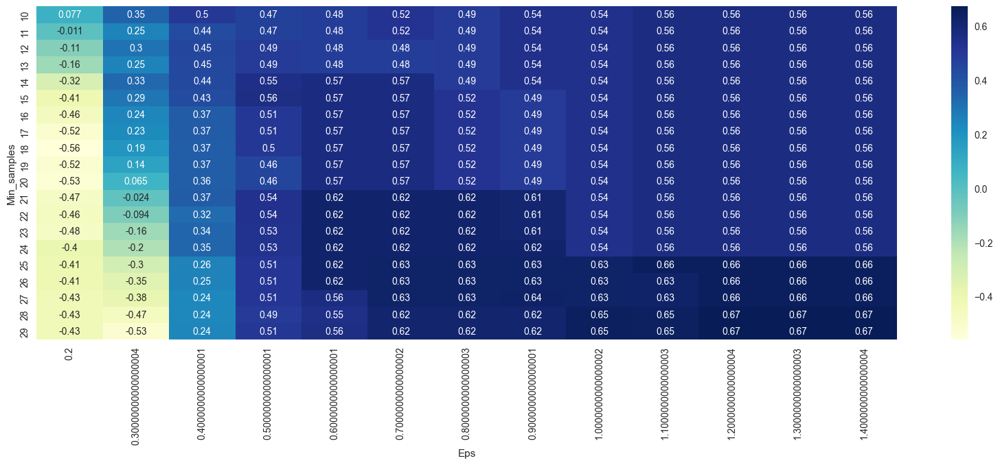

In [46]:
#The heatplot above shows, the number of clusters vary from 17 to 4. However, most of the combinations gives 4-7 clusters. To decide which combination to choose I will use a metric - a silhuette score and I will plot it as a heatmap again.

tmp = pd.DataFrame.from_records(DBSCAN_params, columns =['Eps', 'Min_samples'])   
tmp['Sil_score'] = sil_score

pivot_1 = pd.pivot_table(tmp, values='Sil_score', index='Min_samples', columns='Eps')

fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_1, annot=True, annot_kws={"size": 10}, cmap="YlGnBu", ax=ax)
plt.show()

In [47]:
DBS_clustering = DBSCAN(eps=.9, min_samples=4).fit(umap_data_df)

DBSCAN_clustered = umap_data_df.copy()
DBSCAN_clustered.loc[:,'Cluster'] = DBS_clustering.labels_ # append labels to points

In [48]:
DBSCAN_clust_sizes = DBSCAN_clustered.groupby('Cluster').size().to_frame()
DBSCAN_clust_sizes.columns = ["DBSCAN_size"]
DBSCAN_clust_sizes

,DBSCAN_size
Cluster,
0,666
1,315
2,413
3,537
4,39
5,20
6,30
7,27
8,24


## Hierarchical Density-Based Spatial Clustering for Applications with Noise (HDBSCAN)

### HDBSCAN is a more recently developed algorithm [3] built upon DBSCAN, which, unlike its predecessor, is capable of identifying clusters of varying density. The algorithm starts off very similar by finding the core distance of each data point. Unlike DBSCAN, however, which uses eps as a cutoff on the corresponding dendrogram, HDBSCAN condenses the dendrogram by viewing splits that yield only a small number of points splitting off as points that are falling out of a cluster. The result is a smaller tree with fewer clusters that are losing points (Fig. 2), which can then be used to select the most stable and persistent clusters.

### The size of the clusters that are kept is defined by HDBSCAN’s only required input parameter:

### min_cluster_size: minimum number of data points to form a cluster.

### This parameter determines whether points are falling out of a cluster or splitting to form two new clusters. What this process enables is that the resulting tree can be cut at varying height and clusters of varying density picked based on their stability.

### Two parameters:

### Minimum samples (“MinPts”): the fewest number of points required to form a cluster
### ε (epsilon or “eps”): the maximum distance two points can be from one another while still belonging to the same cluster



In [49]:
#https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html
#http://www.sefidian.com/2020/12/18/how-to-determine-epsilon-and-minpts-parameters-of-dbscan-clustering/
#https://hdbscan.readthedocs.io/en/latest/how_hdbscan_works.html

#HDBSCAN(algorithm='best', alpha=1.0, approx_min_span_tree=True,
#    gen_min_span_tree=True, leaf_size=40, memory=Memory(cachedir=None),
#    metric='euclidean', min_cluster_size=5, min_samples=None, p=None)

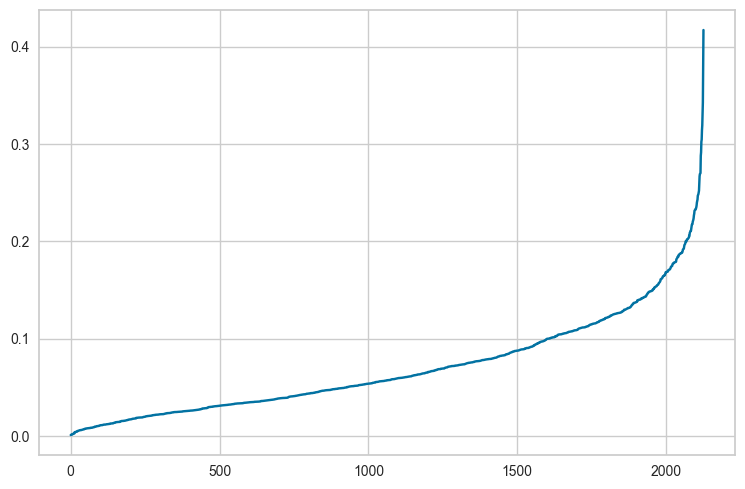

In [50]:
# selecting Epsilon (ε)
from sklearn.neighbors import NearestNeighbors
from matplotlib import pyplot as plt

neighbors = NearestNeighbors(n_neighbors=20)
neighbors_fit = neighbors.fit(umap_data)
distances, indices = neighbors_fit.kneighbors(umap_data)

distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

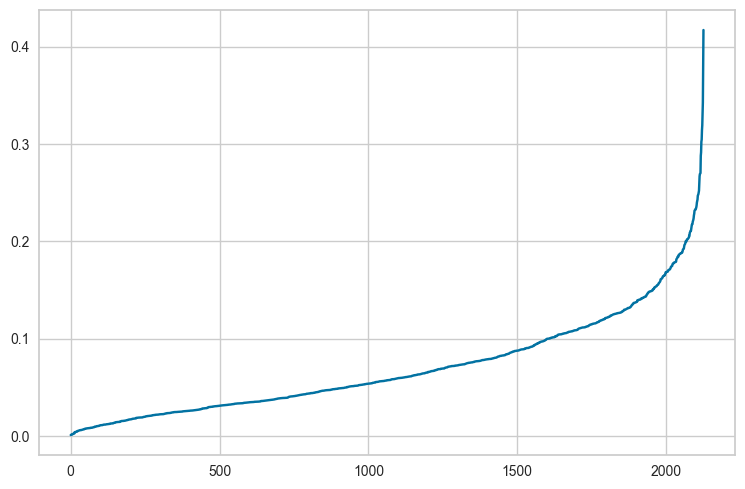

In [51]:
nn_model = NearestNeighbors(n_neighbors=2)
nn_model.fit(umap_data)
distances, indices = nn_model.kneighbors(umap_data)
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)

In [52]:
import hdbscan
clusterer = hdbscan.HDBSCAN(min_cluster_size=50, min_samples=150,gen_min_span_tree=True)
clusterer.fit(umap_data)

HDBSCAN(gen_min_span_tree=True, min_cluster_size=50, min_samples=150)

In [53]:
px.scatter_3d(x=umap_data[:,0], y=umap_data[:,1], z=umap_data[:,2], color=clusterer.labels_.astype(str), title="UMAP => HDBSCAN")

## Univariate Cluster Comparison

C:\Users\Abhishek Jaiswal\AppData\Local\Temp\ipykernel_15016\1790127759.py:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



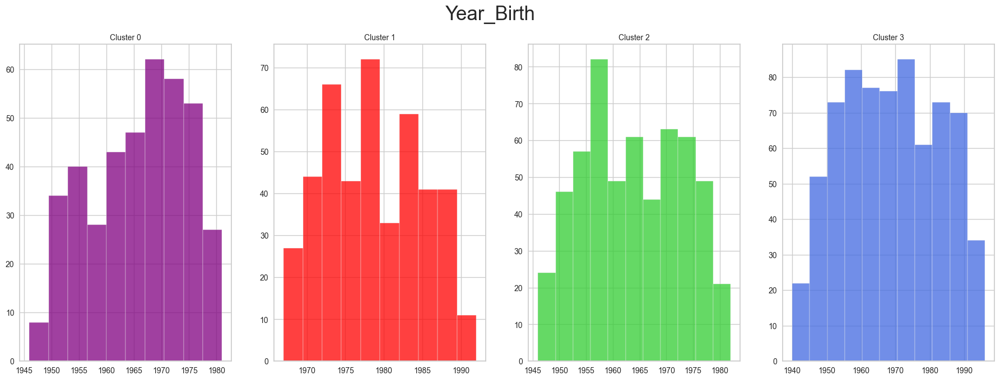

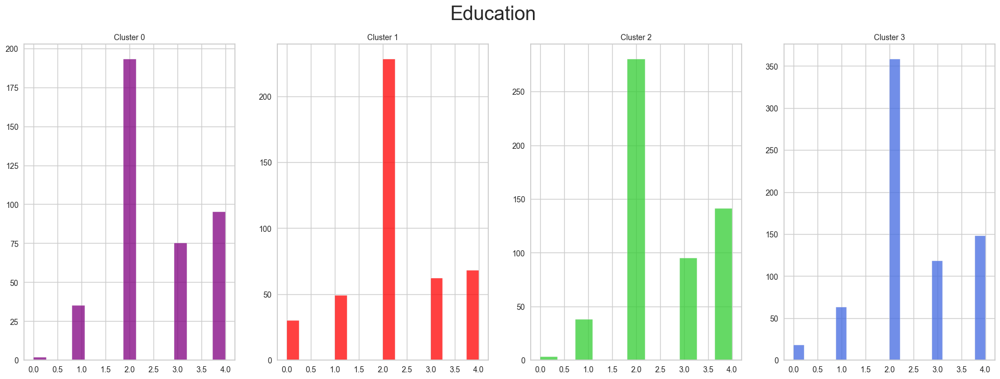

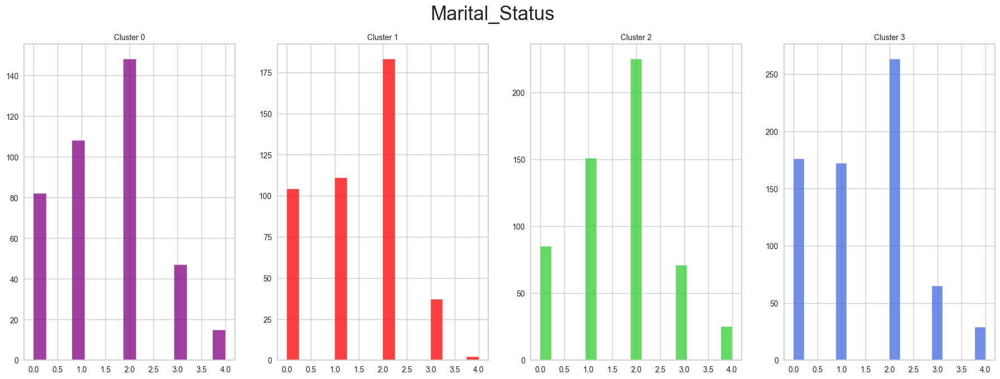

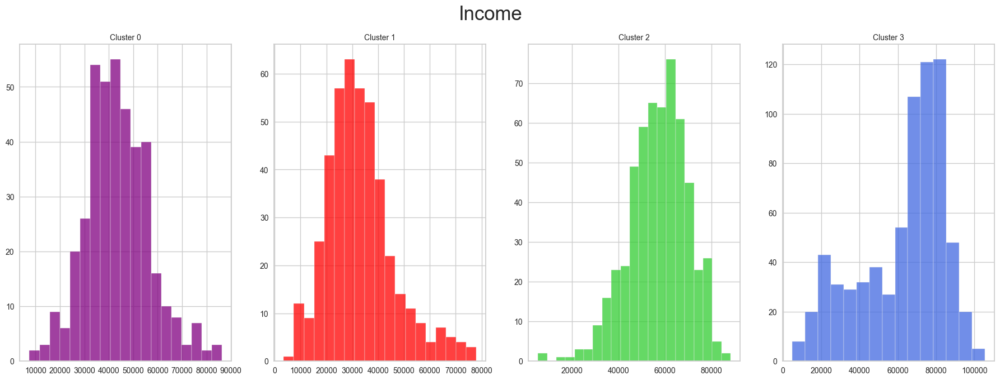

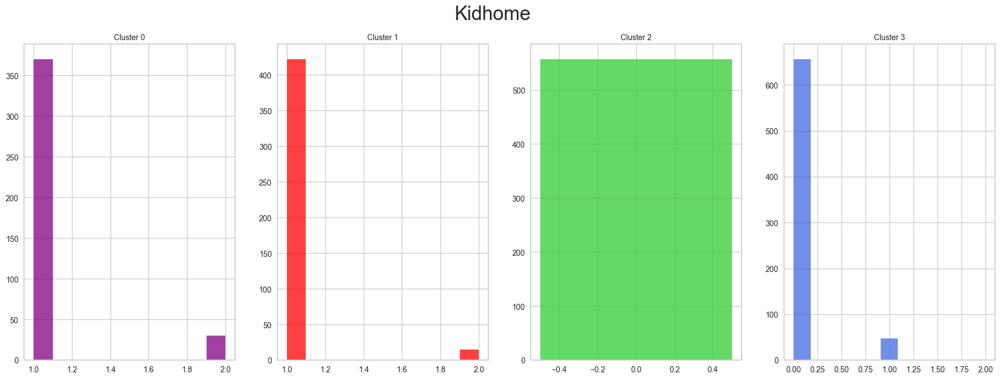

...

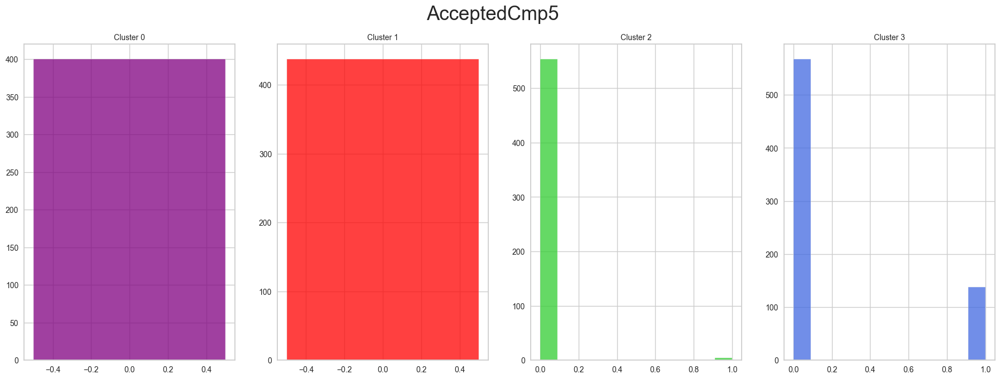

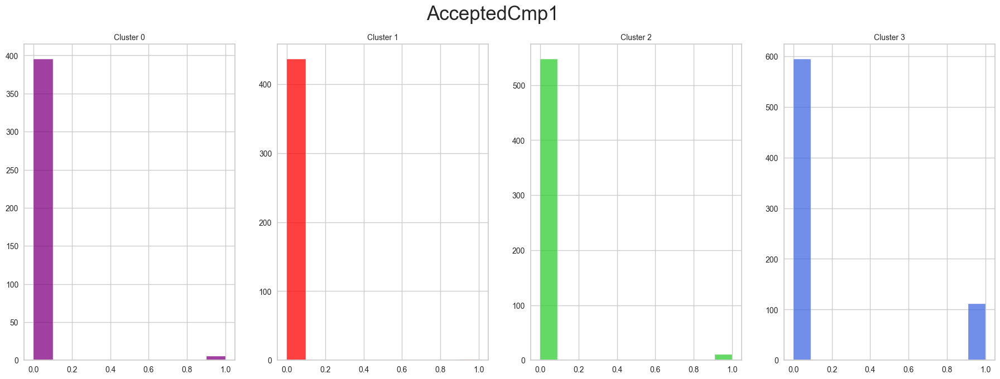

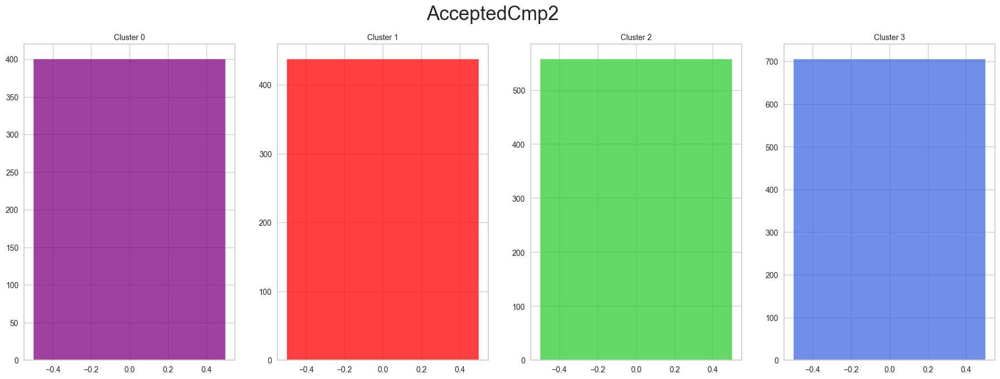

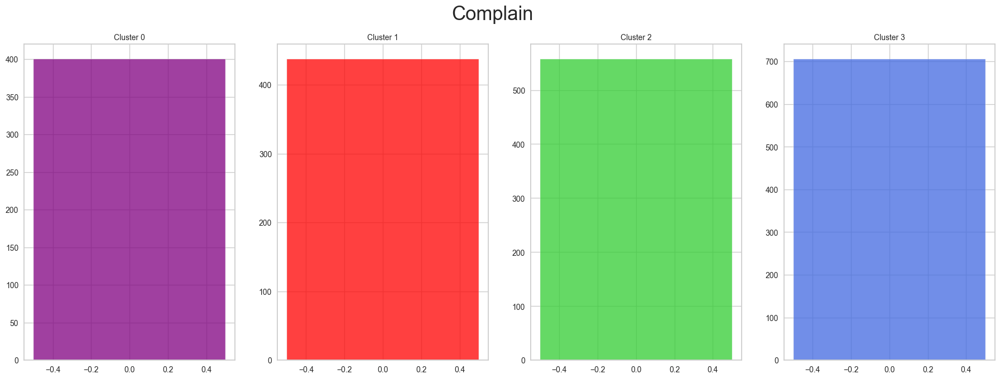

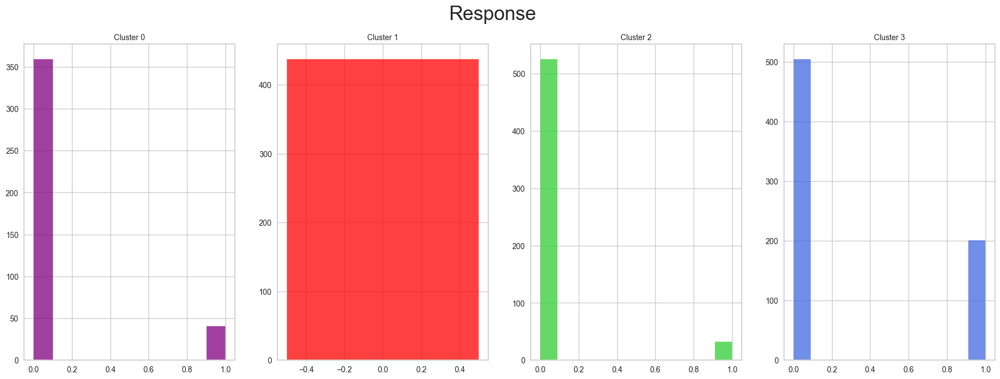

In [54]:
for col in data.columns:
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(20,7))
    fig.suptitle(col, fontsize=25)
    c = data[col]
    sns.histplot(x=c[clusterer.labels_==0], color="purple", ax=axes[0])
    sns.histplot(x=c[clusterer.labels_==1], color="red", ax=axes[1])
    sns.histplot(x=c[clusterer.labels_==2], color="limegreen", ax=axes[2])
    sns.histplot(x=c[clusterer.labels_==3], color="royalblue", ax=axes[3])
    for i in range(4):
        axes[i].set_xlabel(None)
        axes[i].set_ylabel(None)
        axes[i].set_title(f"Cluster {i}", fontsize=10)
plt.show()

<AxesSubplot: ylabel='distance'>

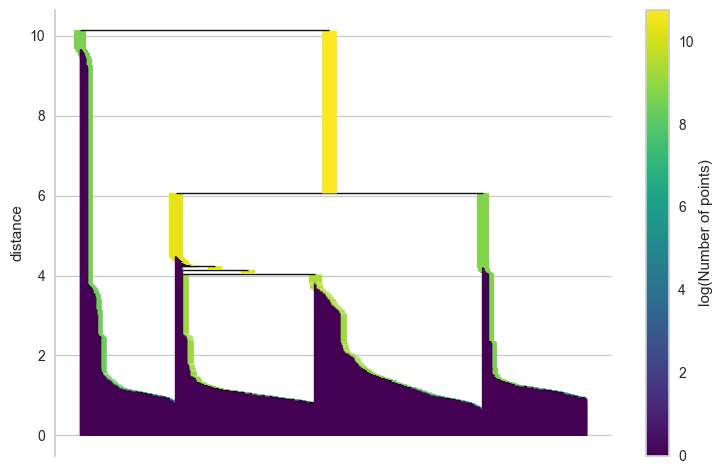

In [55]:
clusterer.single_linkage_tree_.plot(cmap='viridis', colorbar=True)

<AxesSubplot: ylabel='$\\lambda$ value'>

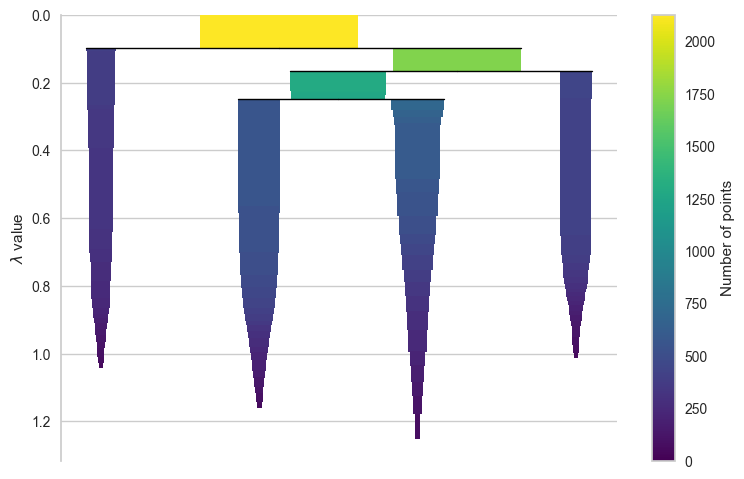

In [56]:
clusterer.condensed_tree_.plot()

<AxesSubplot: ylabel='$\\lambda$ value'>

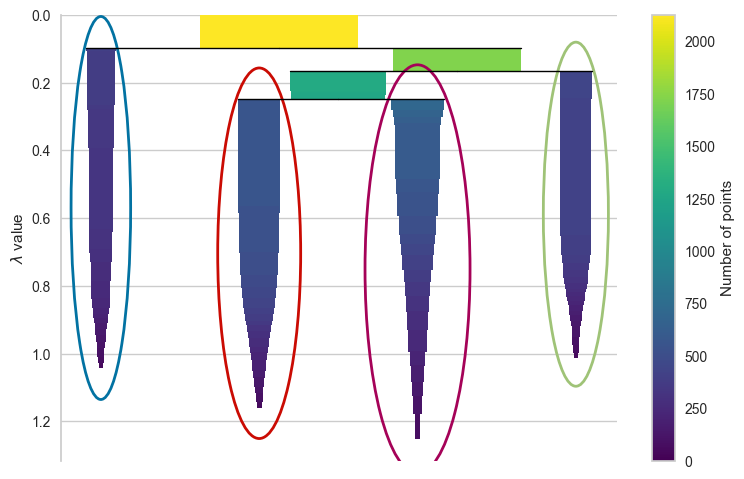

In [57]:
clusterer.condensed_tree_.plot(select_clusters=True, selection_palette=sns.color_palette())

<AxesSubplot: >

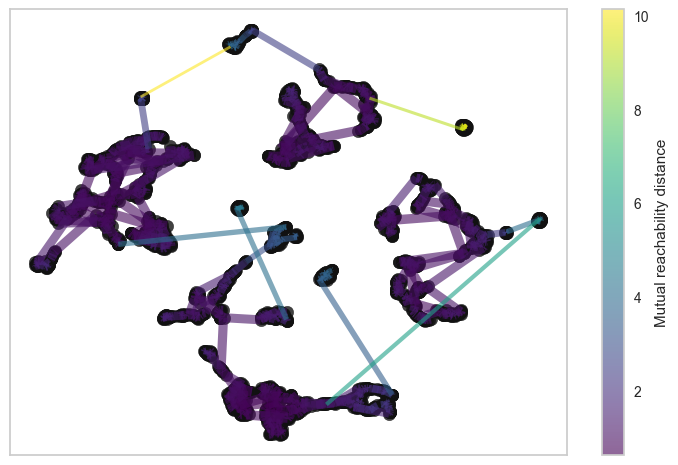

In [58]:
clusterer.minimum_spanning_tree_.plot(edge_cmap='viridis',
                                      edge_alpha=0.6,
                                      node_size=80,
                                      edge_linewidth=2)

In [59]:
#https://www.kaggle.com/code/mahmoudlimam/3d-customer-segmentation-umap-hdbscan



## Affinity Propagation

In [60]:
#Use case - customers segmentation

In [61]:
from sklearn.cluster import AffinityPropagation

In [62]:
no_of_clusters = []
preferences = range(-200,-50,10) # arbitraty chosen range
af_sil_score = [] # silouette scores

for p in preferences:
    AF = AffinityPropagation(preference=p, max_iter=20).fit(umap_data_df)
    no_of_clusters.append((len(np.unique(AF.labels_))))
    af_sil_score.append(silhouette_score(umap_data_df, AF.labels_))
    
af_results = pd.DataFrame([preferences, no_of_clusters, af_sil_score], index=['preference','clusters', 'sil_score']).T
af_results.sort_values(by='sil_score', ascending=False).head() # display only 5 best scores

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_affinity_propagation.py:143: ConvergenceWarning:

Affinity propagation did not converge, this model may return degenerate cluster centers and labels.

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_affinity_propagation.py:143: ConvergenceWarning:

Affinity propagation did not converge, this model may return degenerate cluster centers and labels.

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_affinity_propagation.py:143: ConvergenceWarning:

Affinity propagation did not converge, this model may return degenerate cluster centers and labels.

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_affinity_propagation.py:143: ConvergenceWarning:

Affinity propagation did not converge, this model may return degenerate cluster centers and labels.

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_a

,preference,clusters,sil_score
3,-170.0,980.0,0.259084
4,-160.0,1441.0,0.213858
1,-190.0,1287.0,0.166183
9,-110.0,1415.0,0.109810
5,-150.0,1430.0,0.100436


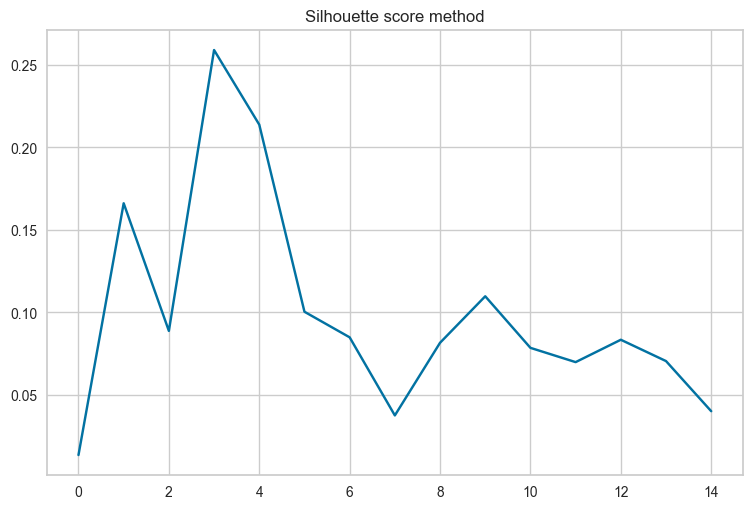

In [63]:
#fig, ax = plt.subplots(figsize=(12,5))
ax = sns.lineplot(af_sil_score)
ax.set_title("Silhouette score method")
#ax.set_xlabel("number of clusters")
#ax.set_ylabel("Silhouette score")
#ax.axvline(-170, ls="--", c="red")
#plt.grid()
plt.show()

In [64]:
AF = AffinityPropagation(preference=-170).fit(umap_data_df)

C:\Users\Abhishek Jaiswal\.conda\envs\mlenv\lib\site-packages\sklearn\cluster\_affinity_propagation.py:143: ConvergenceWarning:

Affinity propagation did not converge, this model may return degenerate cluster centers and labels.



In [65]:
AF_clustered = umap_data_df.copy()
AF_clustered.loc[:,'Cluster'] = AF.labels_ # append labels to points

In [66]:
AF_clust_sizes = AF_clustered.groupby('Cluster').size().to_frame()
AF_clust_sizes.columns = ["AF_size"]
AF_clust_sizes

,AF_size
Cluster,
0,1
1,1
2,1
3,1
4,1
...,...
1868,1
1869,1
1870,1


In [67]:
#https://www.kaggle.com/code/datark1/customers-clustering-k-means-dbscan-and-ap

## KPrototypes Clustering

In [68]:
from kmodes.kprototypes import KPrototypes

In [69]:
data

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response
0,1957,2,0,58138.0,0,0,58,635,88,546,...,10,4,7,0,0,0,0,0,0,1
1,1954,2,0,46344.0,1,1,38,11,1,6,...,1,2,5,0,0,0,0,0,0,0
2,1965,2,1,71613.0,0,0,26,426,49,127,...,2,10,4,0,0,0,0,0,0,0
3,1984,2,1,26646.0,1,0,26,11,4,20,...,0,4,6,0,0,0,0,0,0,0
4,1981,4,2,58293.0,1,0,94,173,43,118,...,3,6,5,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,1967,2,2,61223.0,0,1,46,709,43,182,...,3,4,5,0,0,0,0,0,0,0
2236,1946,4,1,64014.0,2,1,56,406,0,30,...,2,5,7,0,0,0,1,0,0,0
2237,1981,2,3,56981.0,0,0,91,908,48,217,...,3,13,6,0,1,0,0,0,0,0
2238,1956,3,1,69245.0,0,1,8,428,30,214,...,5,10,3,0,0,0,0,0,0,0


In [70]:
#df_scaled = pd.concat([umap_data_df,dat[['Education','Marital_Status']]]) 
dat.reset_index(inplace = True,drop = True)
df_scaled = dat[['Education','Marital_Status','Recency','MntMeatProducts','Teenhome']]
df_scaled = df_scaled.dropna()
df_scaled.tail(5)

,Education,Marital_Status,Recency,MntMeatProducts,Teenhome
2121,Graduation,Married,46,182,1
2122,PhD,Together,56,30,1
2123,Graduation,Divorced,91,217,0
2124,Master,Together,8,214,1
2125,PhD,Married,40,61,1


In [71]:
df_scaled.dtypes

Education          object
Marital_Status     object
Recency             int64
MntMeatProducts     int64
Teenhome            int64
dtype: object

In [72]:
#Pre-processing numerical data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df= df_scaled.copy()
for c in list(df.select_dtypes(exclude=['object']).columns):
    df_scaled.loc[:,c] = scaler.fit_transform(np.array(df[c]).reshape(-1, 1)).flatten()

categorical_columns = [0,1]
df_scaled.head(2)

,Education,Marital_Status,Recency,MntMeatProducts,Teenhome
0,Graduation,Single,0.298738,1.799976,-0.932259
1,Graduation,Single,-0.394205,-0.728249,0.911446


In [73]:
#Elbow plot with cost (will take a LONG time)
costs = []
n_clusters = []
clusters_assigned = []
categorical_columns = [0,1]

for i in range(2, 20):
    try:
        kproto = KPrototypes(n_clusters=i, random_state=10, init='Huang', n_init=1, verbose=1)
        clusters = kproto.fit_predict(df_scaled, categorical=categorical_columns)
        costs.append(kproto.cost_)
        n_clusters.append(i)
        clusters_assigned.append(clusters)
    except:
        print(f"Can't cluster with {i} clusters")

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 20, ncost: 5413.208891886744
Run: 1, iteration: 2/100, moves: 0, ncost: 5413.208891886744
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 335, ncost: 4609.443589151371
Run: 1, iteration: 2/100, moves: 96, ncost: 4577.984870551308
Run: 1, iteration: 3/100, moves: 54, ncost: 4562.40918025704
Run: 1, iteration: 4/100, moves: 26, ncost: 4560.002817905346
Run: 1, iteration: 5/100, moves: 16, ncost: 4559.319775961679
Run: 1, iteration: 6/100, moves: 5, ncost: 4559.256375709395
Run: 1, iteration: 7/100, moves: 1, ncost: 4559.247643044179
Run: 1, iteration: 8/100, moves: 1, ncost: 4559.236413939655
Run: 1, iteration: 9/100, moves: 1, ncost: 4559.230595491138
Run: 1, iteration: 10/100, moves: 0, ncost: 4559.230595491138
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/

Run: 1, iteration: 12/100, moves: 0, ncost: 1866.98966843639
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 540, ncost: 1906.578242312916
Run: 1, iteration: 2/100, moves: 218, ncost: 1840.2254995191188
Run: 1, iteration: 3/100, moves: 86, ncost: 1824.5379870541162
Run: 1, iteration: 4/100, moves: 45, ncost: 1820.0124683555887
Run: 1, iteration: 5/100, moves: 38, ncost: 1817.945709066359
Run: 1, iteration: 6/100, moves: 24, ncost: 1817.0741607632658
Run: 1, iteration: 7/100, moves: 7, ncost: 1816.8681123559245
Run: 1, iteration: 8/100, moves: 6, ncost: 1816.75449200061
Run: 1, iteration: 9/100, moves: 3, ncost: 1816.689452453514
Run: 1, iteration: 10/100, moves: 0, ncost: 1816.689452453514
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 1274, ncost: 1789.3546854015053
Run: 1, iteration: 2/100, moves: 257, ncost: 1759.0560645235357
Run: 1, iteration: 3/100, m

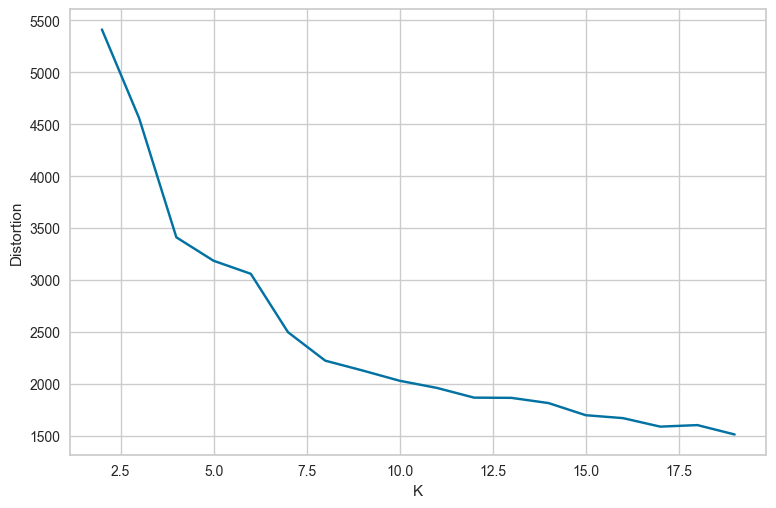

In [74]:
plt.plot(n_clusters, costs, 'bx-')
plt.ylabel('Distortion')
plt.xlabel('K');

In [75]:
#7 for number of clusters seems reasonable choice.

In [76]:
# Check distribution of data among 7 clusters.
np.unique(clusters_assigned[7], return_counts=True)

(array([0, 1, 2, 3, 4, 5, 6, 7, 8], dtype=uint16),
 array([279, 160, 322, 360, 339,  93, 223, 221, 129], dtype=int64))

In [77]:
kproto = KPrototypes(n_clusters=7, random_state=10, init='Huang', n_init=1, verbose=1)
clusters = kproto.fit_predict(df_scaled, categorical=categorical_columns)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 580, ncost: 2549.9829529217764
Run: 1, iteration: 2/100, moves: 121, ncost: 2515.1300017403164
Run: 1, iteration: 3/100, moves: 44, ncost: 2511.689499322646
Run: 1, iteration: 4/100, moves: 19, ncost: 2510.7733686147253
Run: 1, iteration: 5/100, moves: 19, ncost: 2509.208079740637
Run: 1, iteration: 6/100, moves: 30, ncost: 2503.116459070212
Run: 1, iteration: 7/100, moves: 12, ncost: 2501.519315632867
Run: 1, iteration: 8/100, moves: 10, ncost: 2500.9577345586313
Run: 1, iteration: 9/100, moves: 9, ncost: 2500.4291984184115
Run: 1, iteration: 10/100, moves: 12, ncost: 2499.1284443289182
Run: 1, iteration: 11/100, moves: 7, ncost: 2498.927408089156
Run: 1, iteration: 12/100, moves: 3, ncost: 2498.884424262066
Run: 1, iteration: 13/100, moves: 0, ncost: 2498.884424262066


In [78]:
dat['Cluster'] = kproto.labels_
dat.head(4)

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,...,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Response,Cluster
0,1957,Graduation,Single,58138.0,0,0,58,635,88,546,...,4,7,0,0,0,0,0,0,1,0
1,1954,Graduation,Single,46344.0,1,1,38,11,1,6,...,2,5,0,0,0,0,0,0,0,5
2,1965,Graduation,Together,71613.0,0,0,26,426,49,127,...,10,4,0,0,0,0,0,0,0,3
3,1984,Graduation,Together,26646.0,1,0,26,11,4,20,...,4,6,0,0,0,0,0,0,0,3


<AxesSubplot: xlabel='MntMeatProducts', ylabel='Teenhome'>

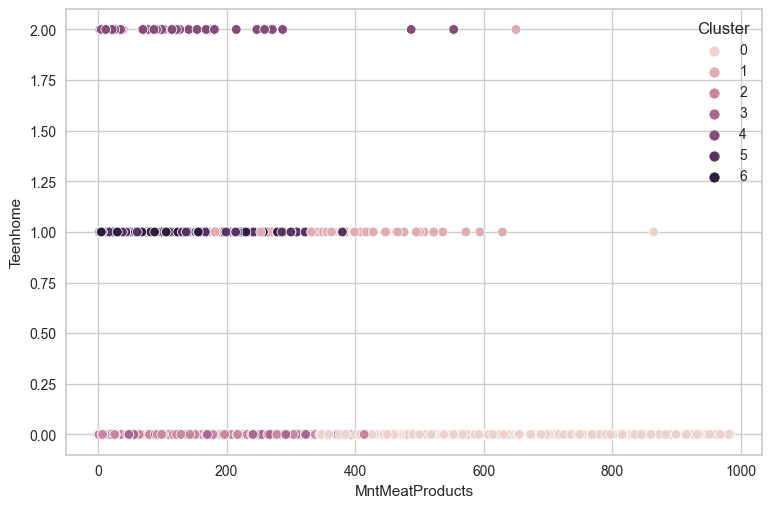

In [79]:
#plt.subplots(figsize=(10,10))
sns.scatterplot(data=dat, x='MntMeatProducts', y='Teenhome', hue='Cluster')

## KModes

### We will use KModes and KPrototype because it is based on categories but KMeans is based on distance and it is not suitable for our dataset

### k-modes is used for clustering categorical variables. It defines clusters based on the number of matching categories between data points. (This is in contrast to the more well-known k-means algorithm, which clusters numerical data based on Euclidean distance.) The k-prototypes algorithm combines k-modes and k-means and is able to cluster mixed numerical / categorical data.

In [80]:
#import modeling tools and metrics
from kmodes.kmodes import KModes
from sklearn.metrics.cluster import rand_score

#ignore warnings
import warnings
warnings.filterwarnings('ignore')

In [81]:
dat["Cluster"].value_counts()

6    463
5    418
3    414
2    390
0    295
1    100
4     46
Name: Cluster, dtype: int64

In [82]:
dat.info()
datK = dat[['Education','Marital_Status']]
y=dat["Cluster"]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 26 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Year_Birth           2126 non-null   int64  
 1   Education            2126 non-null   object 
 2   Marital_Status       2126 non-null   object 
 3   Income               2126 non-null   float64
 4   Kidhome              2126 non-null   int64  
 5   Teenhome             2126 non-null   int64  
 6   Recency              2126 non-null   int64  
 7   MntWines             2126 non-null   int64  
 8   MntFruits            2126 non-null   int64  
 9   MntMeatProducts      2126 non-null   int64  
 10  MntFishProducts      2126 non-null   int64  
 11  MntSweetProducts     2126 non-null   int64  
 12  MntGoldProds         2126 non-null   int64  
 13  NumDealsPurchases    2126 non-null   int64  
 14  NumWebPurchases      2126 non-null   int64  
 15  NumCatalogPurchases  2126 non-null   i

In [83]:
#modeling with KModes
kmodes = KModes(n_clusters=7, init='Cao', verbose=1)
clusters = kmodes.fit_predict(datK)
clusters

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 729.0


array([4, 4, 3, ..., 5, 1, 6], dtype=uint16)

In [84]:
#KModes evaluation
rand_score(y,clusters)

0.6970230756460628

In [85]:
#https://www.kaggle.com/code/mohammadjafarpoor/mushroom-clustering-kmodes-kprototypes-randindex

## Gaussian Mixture Model algorithm

### One of the problems with k-means is that the data needs to follow a circular format. The way k-means calculates the distance between data points has to do with a circular path, so non-circular data isn't clustered correctly.

### This is an issue that Gaussian mixture models fix. You don’t need circular shaped data for it to work well.

### The Gaussian mixture model uses multiple Gaussian distributions to fit arbitrarily shaped data.

### There are several single Gaussian models that act as hidden layers in this hybrid model. So the model calculates the probability that a data point belongs to a specific Gaussian distribution and that's the cluster it will fall under.

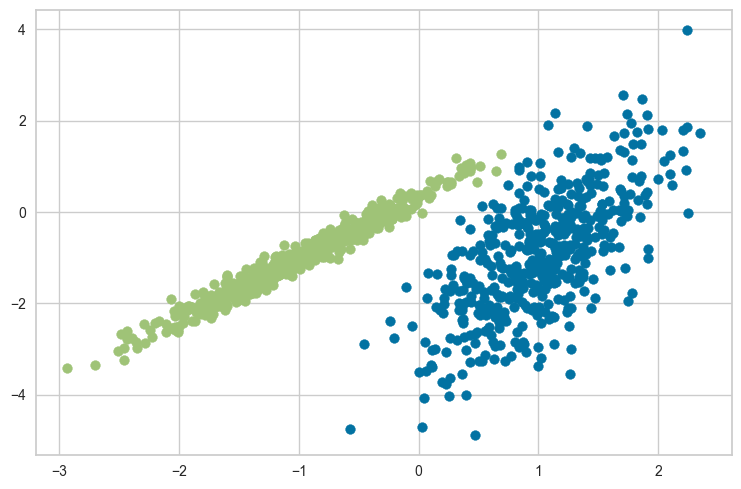

In [103]:
# gaussian mixture clustering
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.mixture import GaussianMixture
from matplotlib import pyplot
# define dataset
X, _ = make_classification(n_samples=1000, n_features=2, n_informative=2, n_redundant=0, n_clusters_per_class=1, random_state=4)
# define the model
model = GaussianMixture(n_components=2)
# fit the model
model.fit(X)
# assign a cluster to each example
yhat = model.predict(X)
# retrieve unique clusters
clusters = unique(yhat)
# create scatter plot for samples from each cluster
for cluster in clusters:
 # get row indexes for samples with this cluster
 row_ix = where(yhat == cluster)
 # create scatter of these samples
 pyplot.scatter(X[row_ix, 0], X[row_ix, 1])
# show the plot
pyplot.show()

## Hierarchical clustering

### Hierarchical clustering (also called hierarchical cluster analysis or HCA) is a method of cluster analysis which seeks to build a hierarchy of clusters. Strategies for hierarchical clustering generally fall into two types:

### Agglomerative : This is a "bottom-up" approach: each observation starts in its own cluster, and pairs of clusters are merged as one moves up the hierarchy.
### Divisive : This is a "top-down" approach: all observations start in one cluster, and splits are performed recursively as one moves down the hierarchy.

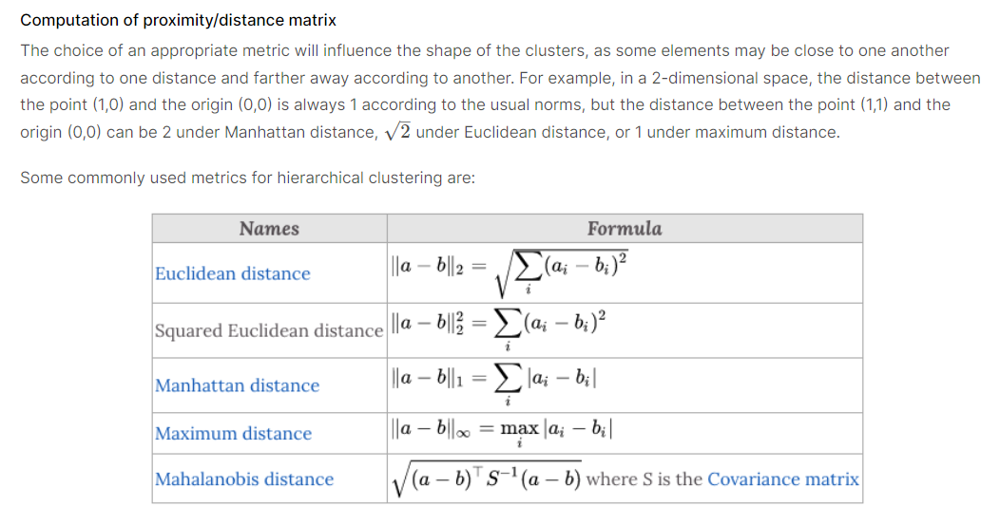

### For text or other non-numeric data, metrics such as the Hamming distance or Levenshtein distance are often used.

### Similar clusters are merged together and formed as a single cluster. Let’s consider B,C, and D,E are similar clusters that are merged in step two. Now, we’re left with four clusters which are A, BC, DE, F. To calculate the proximity between two clusters, we need to define the distance between them. Usually the distance is one of the following:

### The maximum distance between elements of each cluster (also called complete-linkage clustering )
### The minimum distance between elements of each cluster (also called single-linkage clustering )
### The mean distance between elements of each cluster (also called average linkage clustering )
### The sum of all intra-cluster variance.
### Again calculate the proximity of new clusters and merge the similar clusters to form new clusters A, BC, DEF.
### Calculate the proximity of the new clusters. The clusters DEF and BC are similar and merged together to form a new cluster. We’re now left with two clusters A, BCDEF.
### Finally, all the clusters are merged together and form a single cluster.

## Agglomerative Hierarchy clustering algorithm

### This is the most common type of hierarchical clustering algorithm. It's used to group objects in clusters based on how similar they are to each other.

### This is a form of bottom-up clustering, where each data point is assigned to its own cluster. Then those clusters get joined together.

### At each iteration, similar clusters are merged until all of the data points are part of one big root cluster.

### Agglomerative clustering is best at finding small clusters. The end result looks like a dendrogram so that you can easily visualize the clusters when the algorithm finishes.

In [92]:
#Load Data
data=pd.read_csv("C:/BITsPilaniMTECH2123/Sem3/extra/marketing_campaign.csv", sep="\t")
data=data[[ 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response']]
data.head()

,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,58,635,88,546,172,88,88,3,8,10,...,7,0,0,0,0,0,0,3,11,1
1,38,11,1,6,2,1,6,2,1,1,...,5,0,0,0,0,0,0,3,11,0
2,26,426,49,127,111,21,42,1,8,2,...,4,0,0,0,0,0,0,3,11,0
3,26,11,4,20,10,3,5,2,2,0,...,6,0,0,0,0,0,0,3,11,0
4,94,173,43,118,46,27,15,5,5,3,...,5,0,0,0,0,0,0,3,11,0


In [95]:
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.decomposition import PCA

# Standardize data
scaler = StandardScaler() 
scaled_df = scaler.fit_transform(data) 
  
# Normalizing the Data 
normalized_df = normalize(scaled_df) 
  
# Converting the numpy array into a pandas DataFrame 
normalized_df = pd.DataFrame(normalized_df) 
  
# Reducing the dimensions of the data 
pca = PCA(n_components = 2) 
X_principal = pca.fit_transform(normalized_df) 
X_principal = pd.DataFrame(X_principal) 
X_principal.columns = ['P1', 'P2'] 
  
X_principal.head(2)

,P1,P2
0,0.850631,0.105469
1,-0.753075,-0.258850


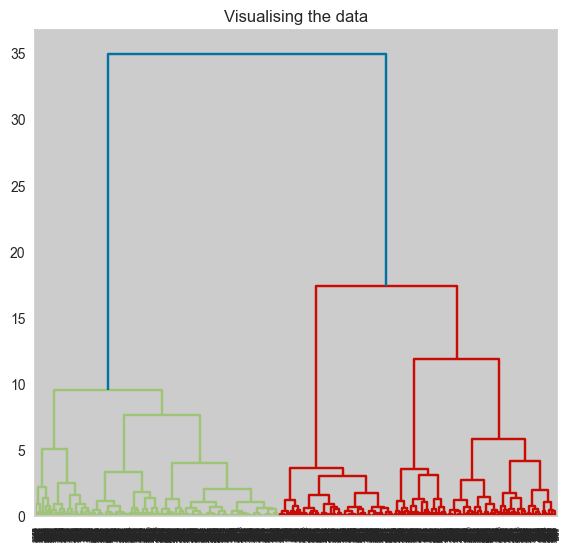

In [97]:
#Dendograms are used to divide a given cluster into many different clusters.
import scipy.cluster.hierarchy as shc

plt.figure(figsize =(6, 6)) 
plt.title('Visualising the data') 
Dendrogram = shc.dendrogram((shc.linkage(X_principal, method ='ward'))) 

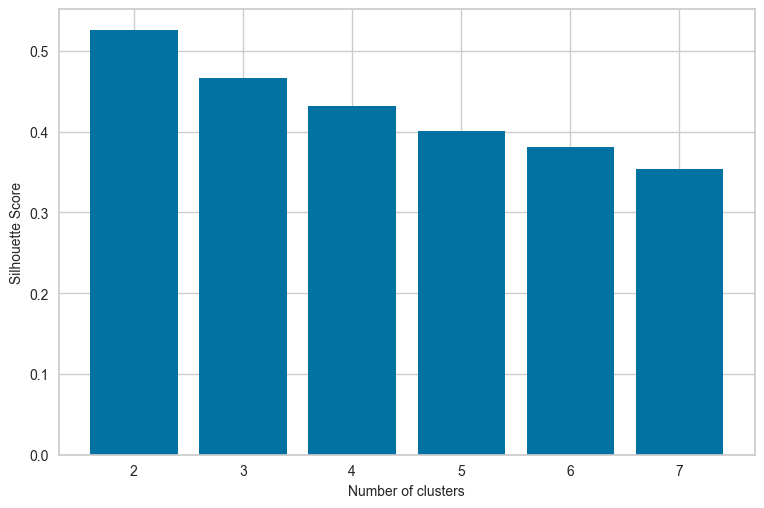

In [98]:
#Determine the optimal number of clusters using [Silhouette Score]
silhouette_scores = [] 

for n_cluster in range(2, 8):
    silhouette_scores.append( 
        silhouette_score(X_principal, AgglomerativeClustering(n_clusters = n_cluster).fit_predict(X_principal))) 
    
# Plotting a bar graph to compare the results 
k = [2, 3, 4, 5, 6,7] 
plt.bar(k, silhouette_scores) 
plt.xlabel('Number of clusters', fontsize = 10) 
plt.ylabel('Silhouette Score', fontsize = 10) 
plt.show() 

In [101]:
from sklearn.cluster import AgglomerativeClustering 
agg = AgglomerativeClustering(n_clusters=3)
agg.fit(X_principal)

AgglomerativeClustering(n_clusters=3)

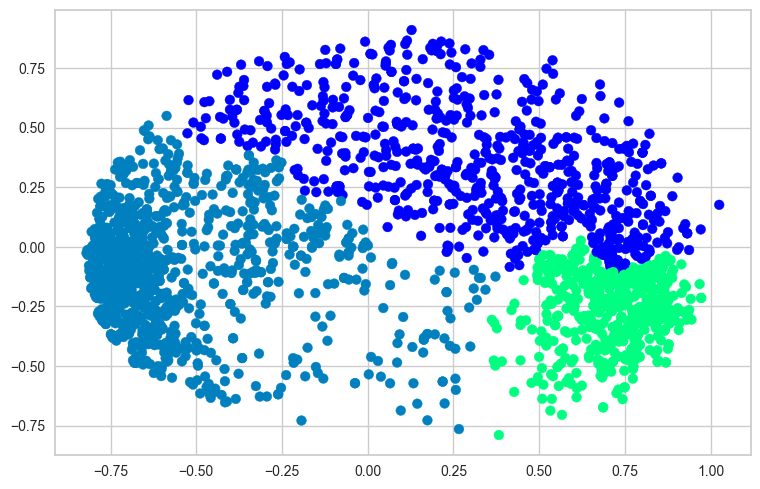

In [100]:
# Visualizing the clustering 
plt.scatter(X_principal['P1'], X_principal['P2'],  
           c = AgglomerativeClustering(n_clusters = 3).fit_predict(X_principal), cmap =plt.cm.winter) 
plt.show() 

## BIRCH

### BIRCH Clustering (BIRCH is short for Balanced Iterative Reducing and Clustering using Hierarchies) involves constructing a tree structure from which cluster centroids are extracted.

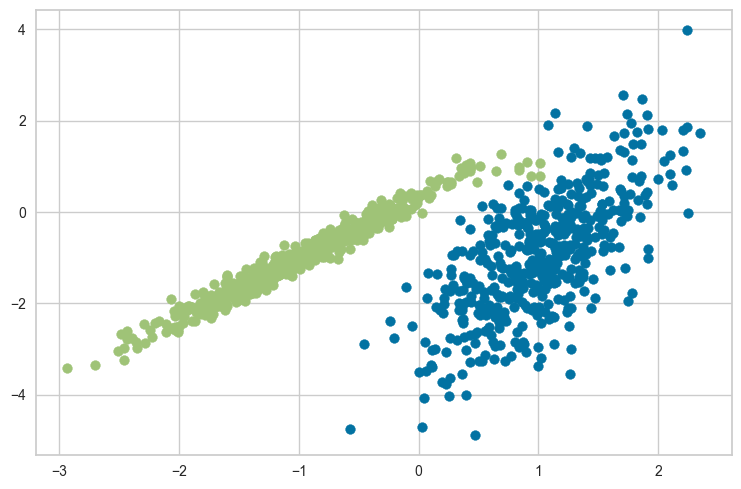

In [104]:
# birch clustering
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import Birch
from matplotlib import pyplot
# define dataset
X, _ = make_classification(n_samples=1000, n_features=2, n_informative=2, n_redundant=0, n_clusters_per_class=1, random_state=4)
# define the model
model = Birch(threshold=0.01, n_clusters=2)
# fit the model
model.fit(X)
# assign a cluster to each example
yhat = model.predict(X)
# retrieve unique clusters
clusters = unique(yhat)
# create scatter plot for samples from each cluster
for cluster in clusters:
 # get row indexes for samples with this cluster
 row_ix = where(yhat == cluster)
 # create scatter of these samples
 pyplot.scatter(X[row_ix, 0], X[row_ix, 1])
# show the plot
pyplot.show()

In [102]:
#https://www.freecodecamp.org/news/8-clustering-algorithms-in-machine-learning-that-all-data-scientists-should-know/
#https://machinelearningmastery.com/clustering-algorithms-with-python/